In [1]:
import tensorflow as tf
import numpy as np
import os, time
import matplotlib.pyplot as plt
%matplotlib inline

import publicMethod

Import publicMethod


In [2]:
# tf.keras.optimizers.Optimizer?
# tf.keras.optimizers.SGD?
# tf.keras.optimizers.Adam?
# tf.saved_model.save?
# tf.saved_model.load?
tf.config.get_visible_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

In [3]:
LOAD_PATH = "./npy/"
SITE_CODE = "722860"
localtime = time.time()
os.mkdir(f"tf_model_3in1_params_{localtime}")
SAVE_PATH = f"./tf_model_3in1_params_{localtime}/"
paths = []
for dirname, _, filenames in os.walk(LOAD_PATH):
    for filename in filenames:
        paths.append(os.path.join(dirname, filename))
print(paths)

['./npy/.DS_Store', './npy/max_722860.npy', './npy/min_745700.npy', './npy/avg_722860.npy', './npy/min_722860.npy', './npy/max_745700.npy', './npy/.npy', './npy/avg_745700.npy']


In [4]:
def construct_model(train_data, train_label, test_data, test_label):
    #strategy = tf.distribute.MirroredStrategy()
    #with strategy.scope():
    model = tf.keras.Sequential([
        tf.keras.layers.Flatten(input_shape=(21,)),
        tf.keras.layers.Dense(128),
        tf.keras.layers.Dense(128),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(64),
        tf.keras.layers.Dense(1)
    ])
    model.compile(optimizer=tf.keras.optimizers.SGD(lr = 1e-6),
                  loss='mse')
    model.summary()

    model.fit(train_data, train_label, epochs=100)

    model.evaluate(test_data, test_label)
    
    return model

In [5]:
def retrain(model, train_data, train_label):
    print("\033[0;31;47m重新训练25次\033[0m")
    model.fit(train_data, train_label, epochs=25)
    return model

In [6]:
def plot(model_predict, test_label, predict_train, train_label, i, name):
    global SITE_CODE
    fig, axes = plt.subplots(4, 1)
    error = model_predict.T[0] - test_label
    axes[0].plot((-error))
    axes[1].plot(test_label, "r")
    axes[1].plot(model_predict, "g")
    
    print(predict_train.shape)
    
    error = predict_train.T[0] - train_label
    axes[2].plot((-error))
    axes[3].plot(train_label, "r")
    axes[3].plot(predict_train, "g")
    plt.xlabel(f"data {name} imf {i} from %s"%SITE_CODE)
    plt.ylabel("Temperature/F")
    plt.gcf().set_size_inches(14, 20)
    plt.savefig(f"./fig/Error_{name}_imf{i}_%s.jpg"%SITE_CODE)
    plt.show()

False
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 21)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2816      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 65        
Total params: 27,649
Trainable params: 27,649
Non-trainable params: 0
______________________________________________

Epoch 84/100
707/707 [==============================] - 1s 760us/step - loss: 3.1825
Epoch 85/100
707/707 [==============================] - 1s 724us/step - loss: 3.1891
Epoch 86/100
707/707 [==============================] - 1s 865us/step - loss: 3.2357
Epoch 87/100
707/707 [==============================] - 1s 754us/step - loss: 3.2071
Epoch 88/100
707/707 [==============================] - 1s 814us/step - loss: 3.2114
Epoch 89/100
707/707 [==============================] - 1s 782us/step - loss: 3.1851
Epoch 90/100
707/707 [==============================] - 1s 723us/step - loss: 3.2131
Epoch 91/100
707/707 [==============================] - 1s 726us/step - loss: 3.2029
Epoch 92/100
707/707 [==============================] - 1s 722us/step - loss: 3.1448
Epoch 93/100
707/707 [==============================] - 1s 735us/step - loss: 3.1252
Epoch 94/100
707/707 [==============================] - 1s 724us/step - loss: 3.1635
Epoch 95/100
707/707 [==============================] - 1s 725us/

707/707 [==============================] - 1s 763us/step - loss: 3.6123
Epoch 64/100
707/707 [==============================] - 1s 798us/step - loss: 3.4417
Epoch 65/100
707/707 [==============================] - 1s 812us/step - loss: 3.4471
Epoch 66/100
707/707 [==============================] - 1s 752us/step - loss: 3.4494
Epoch 67/100
707/707 [==============================] - 1s 737us/step - loss: 3.4737
Epoch 68/100
707/707 [==============================] - 1s 748us/step - loss: 3.4867
Epoch 69/100
707/707 [==============================] - 1s 736us/step - loss: 3.3714
Epoch 70/100
707/707 [==============================] - 1s 769us/step - loss: 3.3868
Epoch 71/100
707/707 [==============================] - 1s 731us/step - loss: 3.4225
Epoch 72/100
707/707 [==============================] - 1s 747us/step - loss: 3.3754
Epoch 73/100
707/707 [==============================] - 1s 769us/step - loss: 3.4501
Epoch 74/100
707/707 [==============================] - 1s 824us/step - loss: 

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars


INFO:tensorflow:Assets written to: ./tf_model_3in1_params_1628050912.707525/722860_combine_3_data_imf1.params/assets
-------------------------------------------------------------------
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 21)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2816      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256      
_________________________________________________________________
den

707/707 [==============================] - 1s 887us/step - loss: 2.4817
Epoch 83/100
707/707 [==============================] - 1s 915us/step - loss: 2.4903
Epoch 84/100
707/707 [==============================] - 1s 848us/step - loss: 2.4681
Epoch 85/100
707/707 [==============================] - 1s 923us/step - loss: 2.5819
Epoch 86/100
707/707 [==============================] - 1s 867us/step - loss: 2.4557
Epoch 87/100
707/707 [==============================] - 1s 933us/step - loss: 2.5020
Epoch 88/100
707/707 [==============================] - 1s 795us/step - loss: 2.4811
Epoch 89/100
707/707 [==============================] - 1s 876us/step - loss: 2.4666
Epoch 90/100
707/707 [==============================] - 1s 914us/step - loss: 2.4494
Epoch 91/100
707/707 [==============================] - 1s 817us/step - loss: 2.4839
Epoch 92/100
707/707 [==============================] - 1s 851us/step - loss: 2.4175
Epoch 93/100
707/707 [==============================] - 1s 855us/step - loss: 

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in double_scalars


707/707 [==============================] - 1s 853us/step - loss: 2.3366
Epoch 2/25
707/707 [==============================] - 1s 867us/step - loss: 2.3439
Epoch 3/25
707/707 [==============================] - 1s 865us/step - loss: 2.3591
Epoch 4/25
707/707 [==============================] - 1s 803us/step - loss: 2.2944
Epoch 5/25
707/707 [==============================] - 1s 862us/step - loss: 2.3095
Epoch 6/25
707/707 [==============================] - 1s 920us/step - loss: 2.3112
Epoch 7/25
707/707 [==============================] - 1s 1ms/step - loss: 2.3062
Epoch 8/25
707/707 [==============================] - 1s 1ms/step - loss: 2.2699
Epoch 9/25
707/707 [==============================] - 1s 1ms/step - loss: 2.2985
Epoch 10/25
707/707 [==============================] - 1s 847us/step - loss: 2.2803
Epoch 11/25
707/707 [==============================] - 1s 817us/step - loss: 2.2826
Epoch 12/25
707/707 [==============================] - 1s 837us/step - loss: 2.2271
Epoch 13/25
707/70

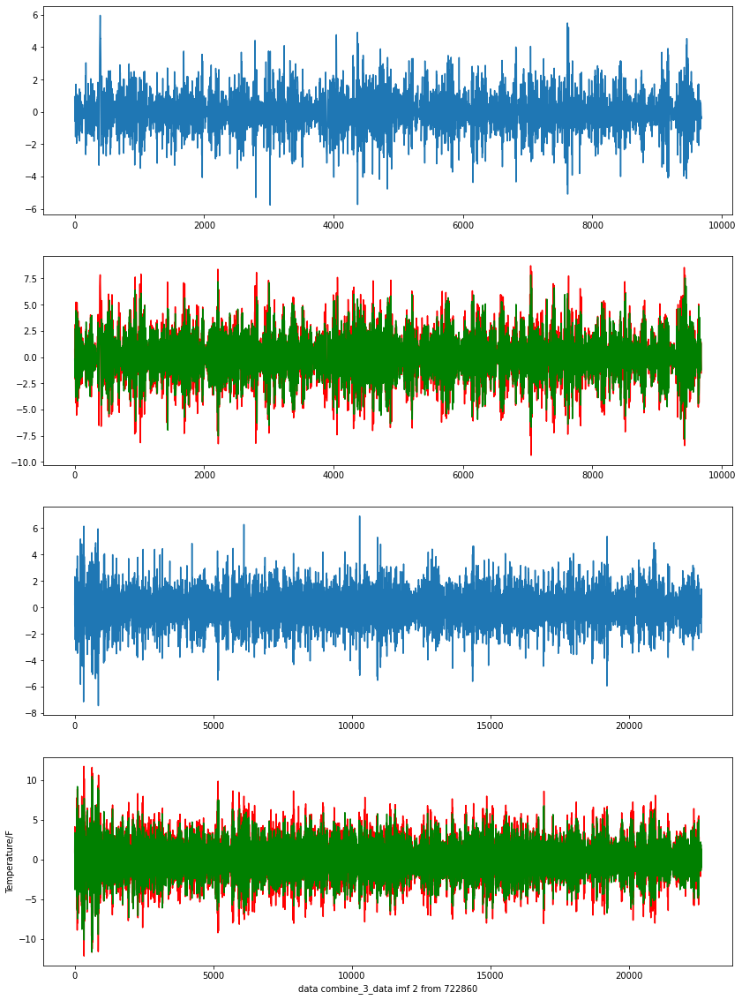

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: divide by zero encountered in double_scalars
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars


Epoch:1
MSE
TRAIN:1.4576745356740466	TEST:1.4103787395929204
Base_line:1.4063151995702567	DIFFERENT:0.004063540022663625
TARGET:inf
INFO:tensorflow:Assets written to: ./tf_model_3in1_params_1628050912.707525/722860_combine_3_data_imf2.params/assets
-------------------------------------------------------------------
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 21)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2816      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
de

707/707 [==============================] - 1s 789us/step - loss: 1.2798
Epoch 81/100
707/707 [==============================] - 1s 769us/step - loss: 1.2745
Epoch 82/100
707/707 [==============================] - 1s 825us/step - loss: 1.2454
Epoch 83/100
707/707 [==============================] - 1s 737us/step - loss: 1.2319
Epoch 84/100
707/707 [==============================] - 1s 899us/step - loss: 1.2101
Epoch 85/100
707/707 [==============================] - 1s 848us/step - loss: 1.2339
Epoch 86/100
707/707 [==============================] - 1s 800us/step - loss: 1.2202
Epoch 87/100
707/707 [==============================] - 1s 757us/step - loss: 1.2700
Epoch 88/100
707/707 [==============================] - 1s 765us/step - loss: 1.2123 0s - loss: 1.21
Epoch 89/100
707/707 [==============================] - 1s 811us/step - loss: 1.2079
Epoch 90/100
707/707 [==============================] - 1s 759us/step - loss: 1.1884
Epoch 91/100
707/707 [==============================] - 1s 770

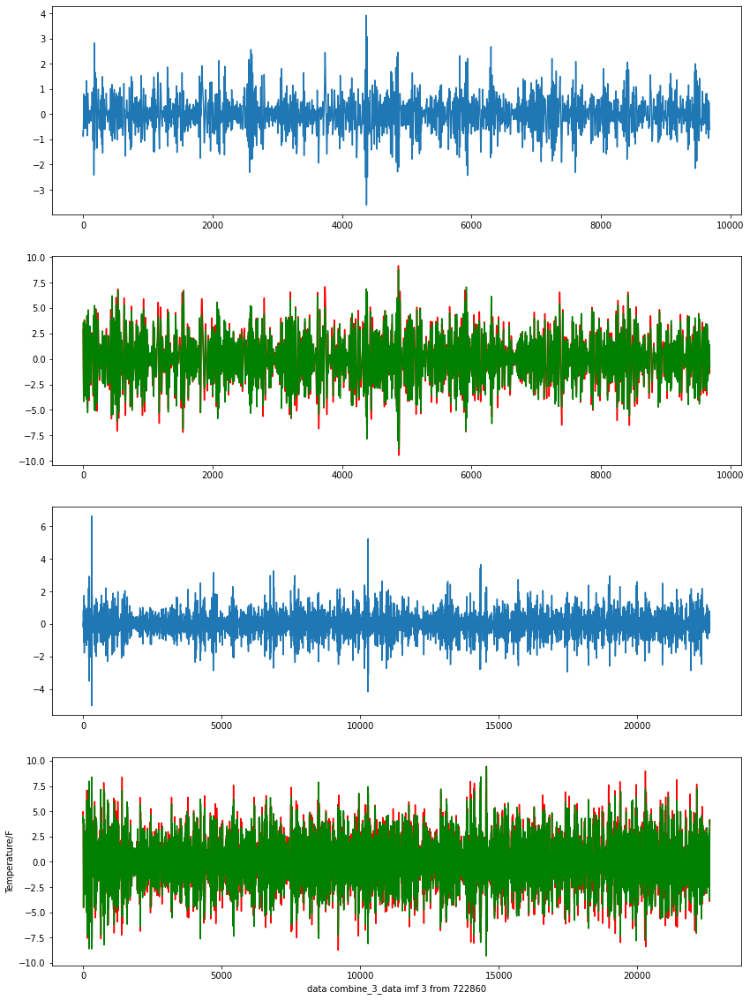

Epoch:1
MSE
TRAIN:0.4657280946140288	TEST:0.39854821908258653
Base_line:0.4206456478800104	DIFFERENT:0.02209742879742388
TARGET:-0.4206456478800104
Epoch:2
MSE
TRAIN:0.4657280946140288	TEST:0.39854821908258653
Base_line:0.4206456478800104	DIFFERENT:0.02209742879742388
TARGET:inf
重新训练25次
Epoch 1/25
142/707 [=====>........................] - ETA: 0s - loss: 1.0341

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in double_scalars


707/707 [==============================] - 1s 998us/step - loss: 1.0153
Epoch 2/25
707/707 [==============================] - 1s 1ms/step - loss: 1.0046
Epoch 3/25
707/707 [==============================] - 1s 843us/step - loss: 0.9977
Epoch 4/25
707/707 [==============================] - 1s 889us/step - loss: 0.9865
Epoch 5/25
707/707 [==============================] - 1s 904us/step - loss: 0.9805
Epoch 6/25
707/707 [==============================] - 1s 1ms/step - loss: 0.9768
Epoch 7/25
707/707 [==============================] - 1s 943us/step - loss: 0.9796
Epoch 8/25
707/707 [==============================] - 1s 1ms/step - loss: 0.9814
Epoch 9/25
707/707 [==============================] - 1s 1ms/step - loss: 0.9662
Epoch 10/25
707/707 [==============================] - 1s 752us/step - loss: 0.9775
Epoch 11/25
707/707 [==============================] - 1s 848us/step - loss: 0.9687 0s - loss: 0.97
Epoch 12/25
707/707 [==============================] - 1s 752us/step - loss: 0.9547
Epoc

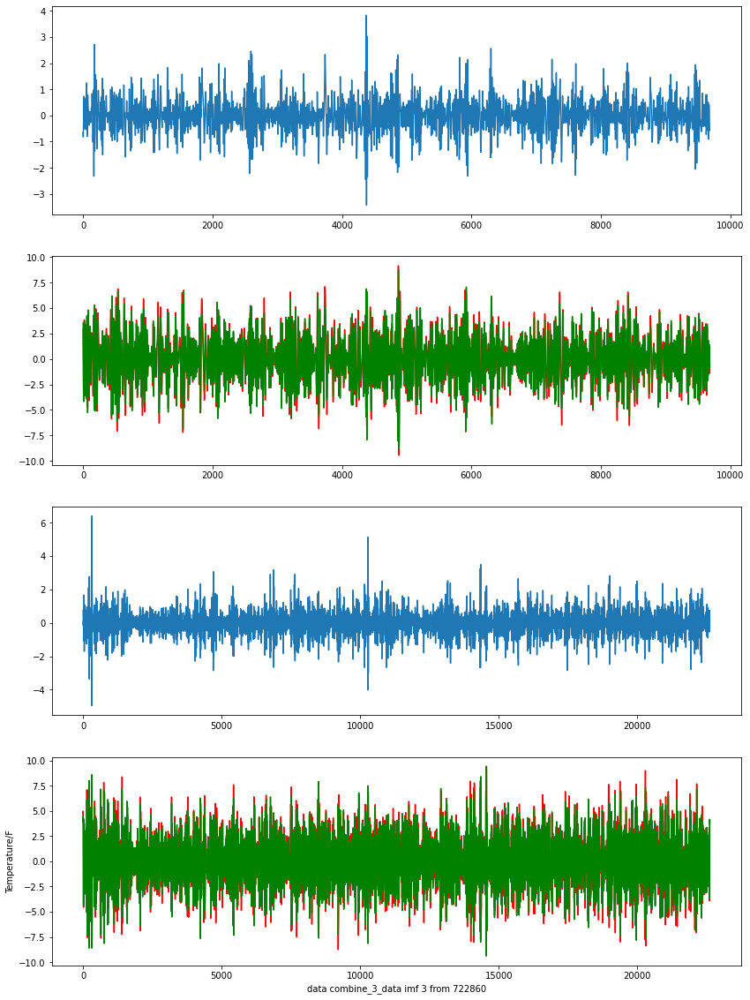

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: divide by zero encountered in double_scalars
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars


Epoch:2
MSE
TRAIN:0.42441974686615314	TEST:0.3623017191148352
Base_line:0.4206456478800104	DIFFERENT:0.05834392876517519
TARGET:inf
INFO:tensorflow:Assets written to: ./tf_model_3in1_params_1628050912.707525/722860_combine_3_data_imf3.params/assets
-------------------------------------------------------------------
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 21)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2816      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
de

707/707 [==============================] - 1s 907us/step - loss: 0.6824
Epoch 81/100
707/707 [==============================] - 1s 795us/step - loss: 0.6713
Epoch 82/100
707/707 [==============================] - 1s 747us/step - loss: 0.6889
Epoch 83/100
707/707 [==============================] - 1s 720us/step - loss: 0.6811
Epoch 84/100
707/707 [==============================] - 1s 729us/step - loss: 0.6659
Epoch 85/100
707/707 [==============================] - 1s 773us/step - loss: 0.6640
Epoch 86/100
707/707 [==============================] - 1s 820us/step - loss: 0.6860
Epoch 87/100
707/707 [==============================] - 1s 793us/step - loss: 0.6649
Epoch 88/100
707/707 [==============================] - 1s 746us/step - loss: 0.6509
Epoch 89/100
707/707 [==============================] - 1s 800us/step - loss: 0.6574
Epoch 90/100
707/707 [==============================] - 1s 832us/step - loss: 0.6591
Epoch 91/100
707/707 [==============================] - 1s 806us/step - loss: 

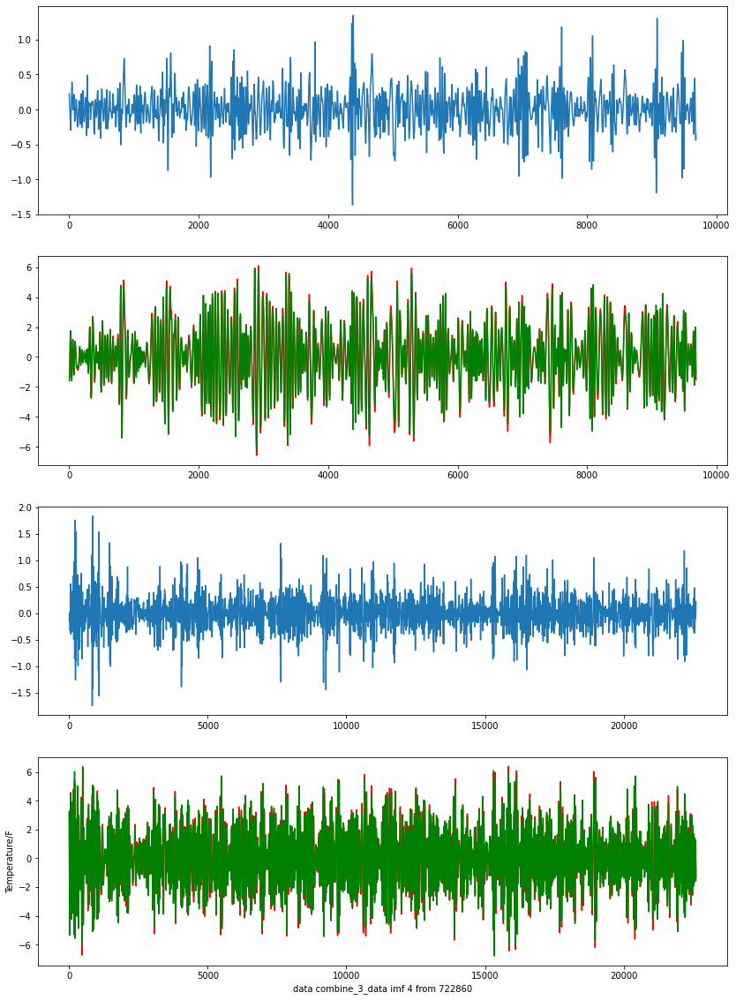

Epoch:1
MSE
TRAIN:0.07706992727283833	TEST:0.06897166352524436
Base_line:0.07800817042557794	DIFFERENT:0.009036506900333571
TARGET:-0.03900408521278897
Epoch:2
MSE
TRAIN:0.07706992727283833	TEST:0.06897166352524436
Base_line:0.07800817042557794	DIFFERENT:0.009036506900333571
TARGET:-0.07800817042557794
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 917us/step - loss: 0.5263
Epoch 2/25
707/707 [==============================] - 1s 860us/step - loss: 0.5202
Epoch 3/25
707/707 [==============================] - 1s 891us/step - loss: 0.5254
Epoch 4/25
707/707 [==============================] - 1s 1ms/step - loss: 0.5330
Epoch 5/25
707/707 [==============================] - 1s 1ms/step - loss: 0.5252
Epoch 6/25
707/707 [==============================] - 1s 889us/step - loss: 0.5147
Epoch 7/25
707/707 [==============================] - 1s 1ms/step - loss: 0.5053
Epoch 8/25
707/707 [==============================] - 1s 859us/step - loss: 0.5079
Epoch 9/25
707/707 [========

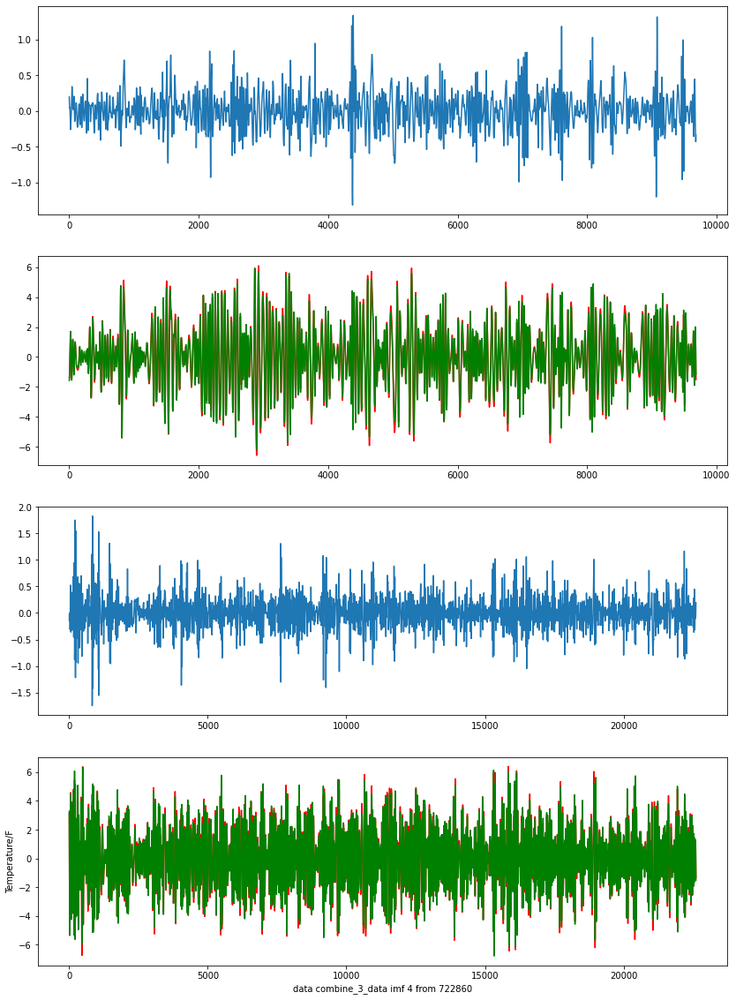

Epoch:2
MSE
TRAIN:0.07059892049348086	TEST:0.06246105290037507
Base_line:0.07800817042557794	DIFFERENT:0.015547117525202866
TARGET:-0.07800817042557794
Epoch:3
MSE
TRAIN:0.07059892049348086	TEST:0.06246105290037507
Base_line:0.07800817042557794	DIFFERENT:0.015547117525202866
TARGET:inf
重新训练25次
Epoch 1/25
185/707 [======>.......................] - ETA: 0s - loss: 0.4759

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in double_scalars


707/707 [==============================] - 1s 768us/step - loss: 0.4796
Epoch 2/25
707/707 [==============================] - 1s 808us/step - loss: 0.4771
Epoch 3/25
707/707 [==============================] - 1s 803us/step - loss: 0.4805
Epoch 4/25
707/707 [==============================] - 1s 740us/step - loss: 0.4661
Epoch 5/25
707/707 [==============================] - 1s 801us/step - loss: 0.4655
Epoch 6/25
707/707 [==============================] - 1s 791us/step - loss: 0.4616
Epoch 7/25
707/707 [==============================] - 1s 883us/step - loss: 0.4710
Epoch 8/25
707/707 [==============================] - 1s 878us/step - loss: 0.4636
Epoch 9/25
707/707 [==============================] - 1s 794us/step - loss: 0.4653
Epoch 10/25
707/707 [==============================] - 1s 726us/step - loss: 0.4705
Epoch 11/25
707/707 [==============================] - 1s 816us/step - loss: 0.4574
Epoch 12/25
707/707 [==============================] - 1s 764us/step - loss: 0.4544
Epoch 13/25


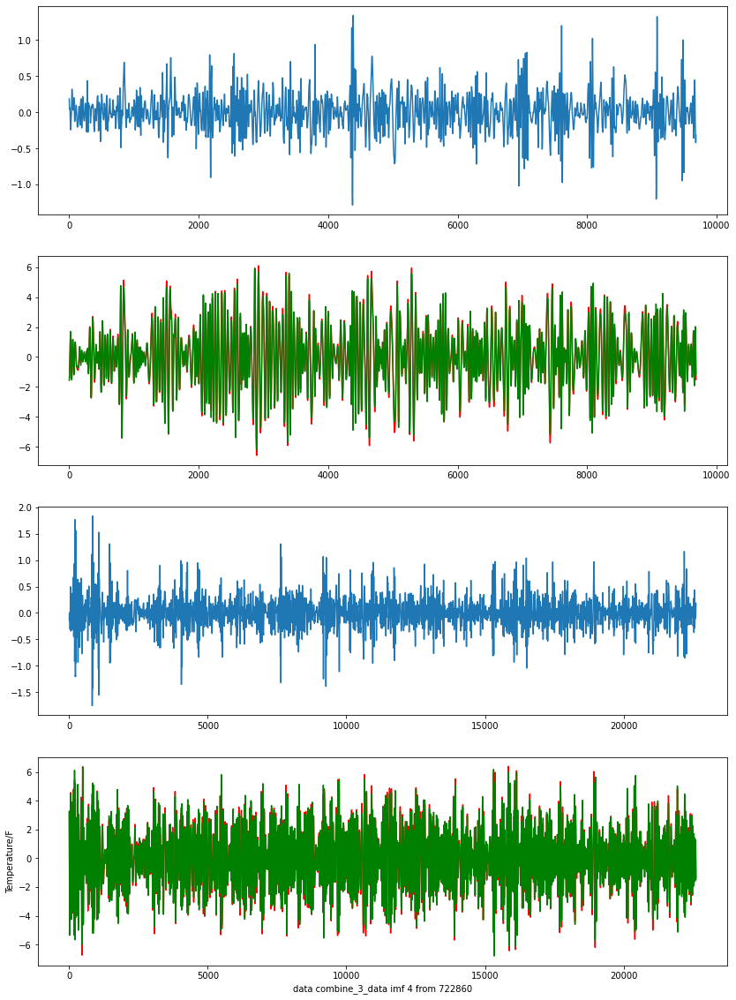

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: divide by zero encountered in double_scalars
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars


Epoch:3
MSE
TRAIN:0.06652677462397158	TEST:0.05832710690196747
Base_line:0.07800817042557794	DIFFERENT:0.019681063523610466
TARGET:inf
INFO:tensorflow:Assets written to: ./tf_model_3in1_params_1628050912.707525/722860_combine_3_data_imf4.params/assets
-------------------------------------------------------------------
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 21)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2816      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________

707/707 [==============================] - 1s 773us/step - loss: 0.5336 0s - loss: 0.533
Epoch 81/100
707/707 [==============================] - 1s 769us/step - loss: 0.5450
Epoch 82/100
707/707 [==============================] - 1s 758us/step - loss: 0.5226
Epoch 83/100
707/707 [==============================] - 1s 807us/step - loss: 0.5431
Epoch 84/100
707/707 [==============================] - 1s 817us/step - loss: 0.5384
Epoch 85/100
707/707 [==============================] - 1s 798us/step - loss: 0.5270
Epoch 86/100
707/707 [==============================] - 1s 756us/step - loss: 0.5233
Epoch 87/100
707/707 [==============================] - 1s 756us/step - loss: 0.5158
Epoch 88/100
707/707 [==============================] - 1s 822us/step - loss: 0.5186
Epoch 89/100
707/707 [==============================] - 1s 751us/step - loss: 0.5302
Epoch 90/100
707/707 [==============================] - 1s 853us/step - loss: 0.5036
Epoch 91/100
707/707 [==============================] - 1s 83

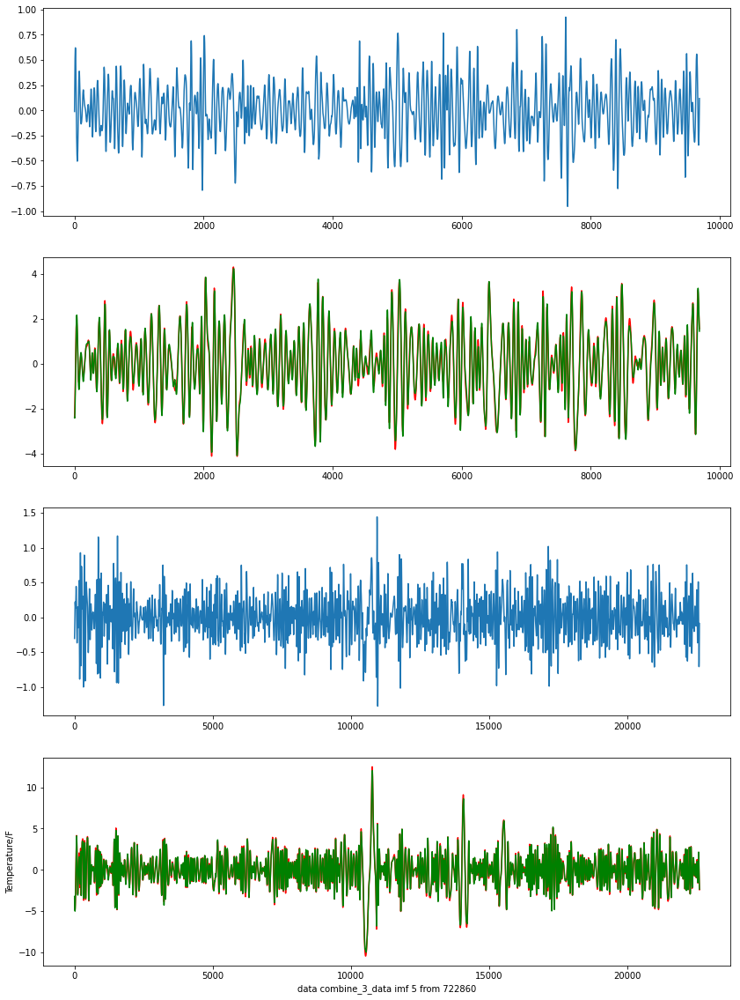

Epoch:1
MSE
TRAIN:0.08895370019014731	TEST:0.06611713124855892
Base_line:0.014249750336895196	DIFFERENT:0.05186738091166372
TARGET:-0.004749916778965065
Epoch:2
MSE
TRAIN:0.08895370019014731	TEST:0.06611713124855892
Base_line:0.014249750336895196	DIFFERENT:0.05186738091166372
TARGET:-0.007124875168447598
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 841us/step - loss: 0.4195
Epoch 2/25
707/707 [==============================] - 1s 1ms/step - loss: 0.4193
Epoch 3/25
707/707 [==============================] - 1s 1ms/step - loss: 0.4307A: 0s - loss: 0.
Epoch 4/25
707/707 [==============================] - 1s 872us/step - loss: 0.4210
Epoch 5/25
707/707 [==============================] - 1s 940us/step - loss: 0.4134
Epoch 6/25
707/707 [==============================] - 1s 1ms/step - loss: 0.4099
Epoch 7/25
707/707 [==============================] - 1s 915us/step - loss: 0.4085
Epoch 8/25
707/707 [==============================] - 1s 825us/step - loss: 0.4021
Epoch 9/25

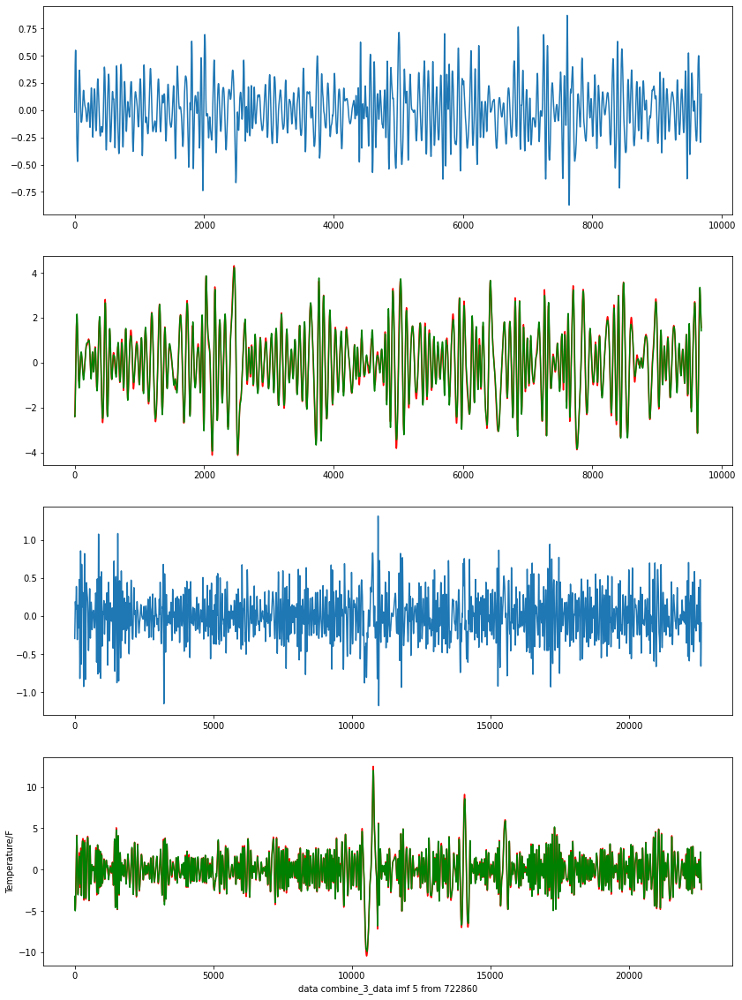

Epoch:2
MSE
TRAIN:0.07552407185439078	TEST:0.05599135025378573
Base_line:0.014249750336895196	DIFFERENT:0.04174159991689053
TARGET:-0.007124875168447598
Epoch:3
MSE
TRAIN:0.07552407185439078	TEST:0.05599135025378573
Base_line:0.014249750336895196	DIFFERENT:0.04174159991689053
TARGET:-0.014249750336895196
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 890us/step - loss: 0.3725
Epoch 2/25
707/707 [==============================] - 1s 841us/step - loss: 0.3808
Epoch 3/25
707/707 [==============================] - 1s 864us/step - loss: 0.3732
Epoch 4/25
707/707 [==============================] - 1s 802us/step - loss: 0.3738
Epoch 5/25
707/707 [==============================] - 1s 756us/step - loss: 0.3719
Epoch 6/25
707/707 [==============================] - 1s 837us/step - loss: 0.3625
Epoch 7/25
707/707 [==============================] - 1s 812us/step - loss: 0.3698
Epoch 8/25
707/707 [==============================] - 1s 825us/step - loss: 0.3698
Epoch 9/25
707/707 [

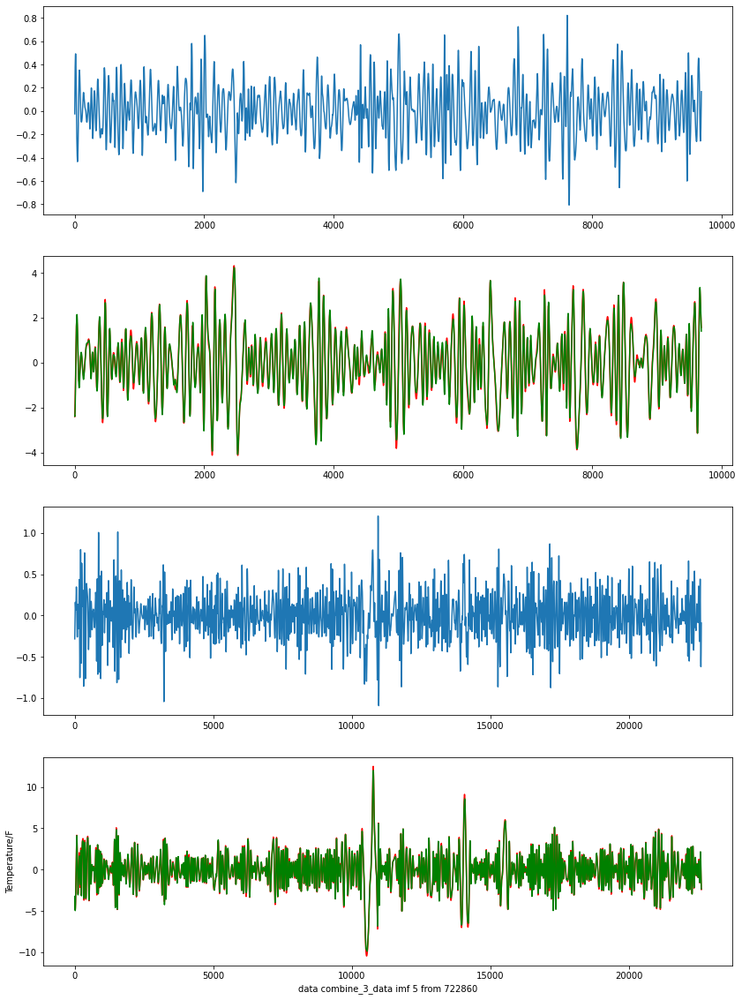

Epoch:3
MSE
TRAIN:0.06511106945451452	TEST:0.048145670396690286
Base_line:0.014249750336895196	DIFFERENT:0.03389592005979509
TARGET:-0.014249750336895196
Epoch:4
MSE
TRAIN:0.06511106945451452	TEST:0.048145670396690286
Base_line:0.014249750336895196	DIFFERENT:0.03389592005979509
TARGET:inf
重新训练25次
Epoch 1/25
173/707 [======>.......................] - ETA: 0s - loss: 0.3418

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in double_scalars


707/707 [==============================] - 1s 880us/step - loss: 0.3450
Epoch 2/25
707/707 [==============================] - 1s 828us/step - loss: 0.3448 0s - loss: 0.3
Epoch 3/25
707/707 [==============================] - 1s 822us/step - loss: 0.3422
Epoch 4/25
707/707 [==============================] - 1s 801us/step - loss: 0.3330
Epoch 5/25
707/707 [==============================] - 1s 841us/step - loss: 0.3339
Epoch 6/25
707/707 [==============================] - 1s 856us/step - loss: 0.3324
Epoch 7/25
707/707 [==============================] - 1s 944us/step - loss: 0.3353
Epoch 8/25
707/707 [==============================] - 1s 839us/step - loss: 0.3226
Epoch 9/25
707/707 [==============================] - 1s 815us/step - loss: 0.3362
Epoch 10/25
707/707 [==============================] - 1s 769us/step - loss: 0.3364
Epoch 11/25
707/707 [==============================] - 1s 821us/step - loss: 0.3312
Epoch 12/25
707/707 [==============================] - 1s 857us/step - loss: 0.32

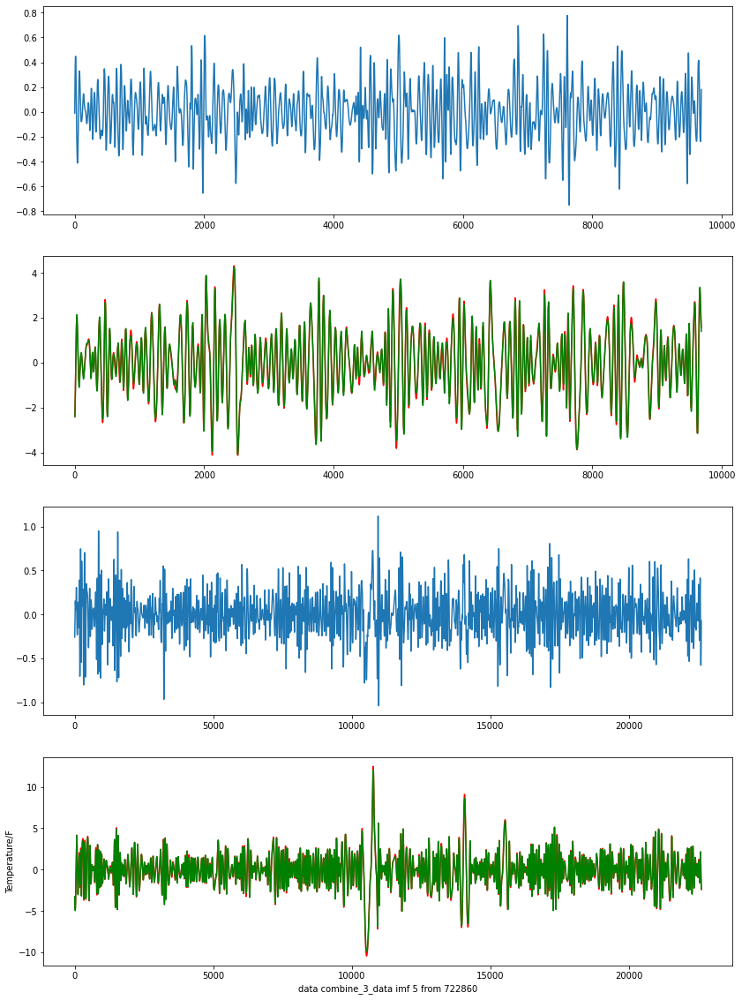

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: divide by zero encountered in double_scalars
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars


Epoch:4
MSE
TRAIN:0.05665706519234848	TEST:0.04196957029930535
Base_line:0.014249750336895196	DIFFERENT:0.02771981996241015
TARGET:inf
INFO:tensorflow:Assets written to: ./tf_model_3in1_params_1628050912.707525/722860_combine_3_data_imf5.params/assets
-------------------------------------------------------------------
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 21)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2816      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________

707/707 [==============================] - 1s 720us/step - loss: 0.9216
Epoch 81/100
707/707 [==============================] - 1s 754us/step - loss: 0.9133
Epoch 82/100
707/707 [==============================] - 1s 760us/step - loss: 0.9005
Epoch 83/100
707/707 [==============================] - 1s 751us/step - loss: 0.8673
Epoch 84/100
707/707 [==============================] - 1s 707us/step - loss: 0.8922
Epoch 85/100
707/707 [==============================] - 1s 708us/step - loss: 0.8610
Epoch 86/100
707/707 [==============================] - 1s 729us/step - loss: 0.8505
Epoch 87/100
707/707 [==============================] - 1s 725us/step - loss: 0.8556
Epoch 88/100
707/707 [==============================] - 1s 732us/step - loss: 0.8313
Epoch 89/100
707/707 [==============================] - 1s 717us/step - loss: 0.8601
Epoch 90/100
707/707 [==============================] - 1s 734us/step - loss: 0.8416 0s - loss: 0.83
Epoch 91/100
707/707 [==============================] - 1s 754

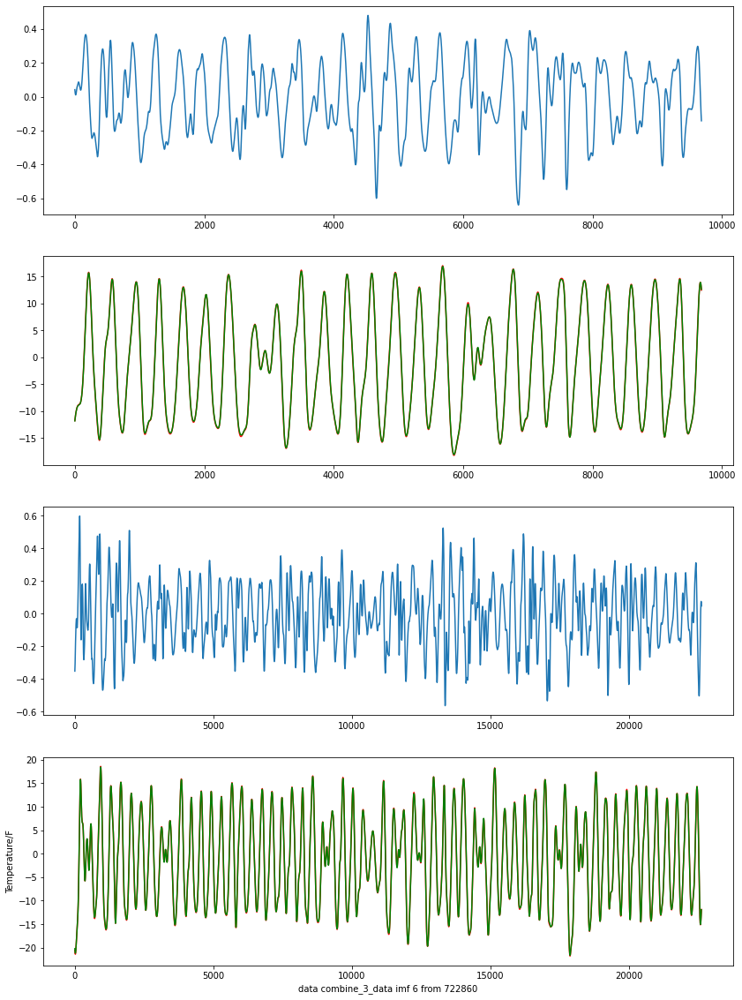

Epoch:1
MSE
TRAIN:0.03849390896005681	TEST:0.04509779385439296
Base_line:0.028481375078935063	DIFFERENT:0.0166164187754579
TARGET:-0.007120343769733766
Epoch:2
MSE
TRAIN:0.03849390896005681	TEST:0.04509779385439296
Base_line:0.028481375078935063	DIFFERENT:0.0166164187754579
TARGET:-0.009493791692978355
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 770us/step - loss: 0.6758
Epoch 2/25
707/707 [==============================] - 1s 735us/step - loss: 0.6621
Epoch 3/25
707/707 [==============================] - 1s 720us/step - loss: 0.6650
Epoch 4/25
707/707 [==============================] - 1s 737us/step - loss: 0.6616
Epoch 5/25
707/707 [==============================] - 1s 708us/step - loss: 0.6595
Epoch 6/25
707/707 [==============================] - 1s 723us/step - loss: 0.6537
Epoch 7/25
707/707 [==============================] - 1s 810us/step - loss: 0.6422
Epoch 8/25
707/707 [==============================] - 1s 764us/step - loss: 0.6357
Epoch 9/25
707/707 [==

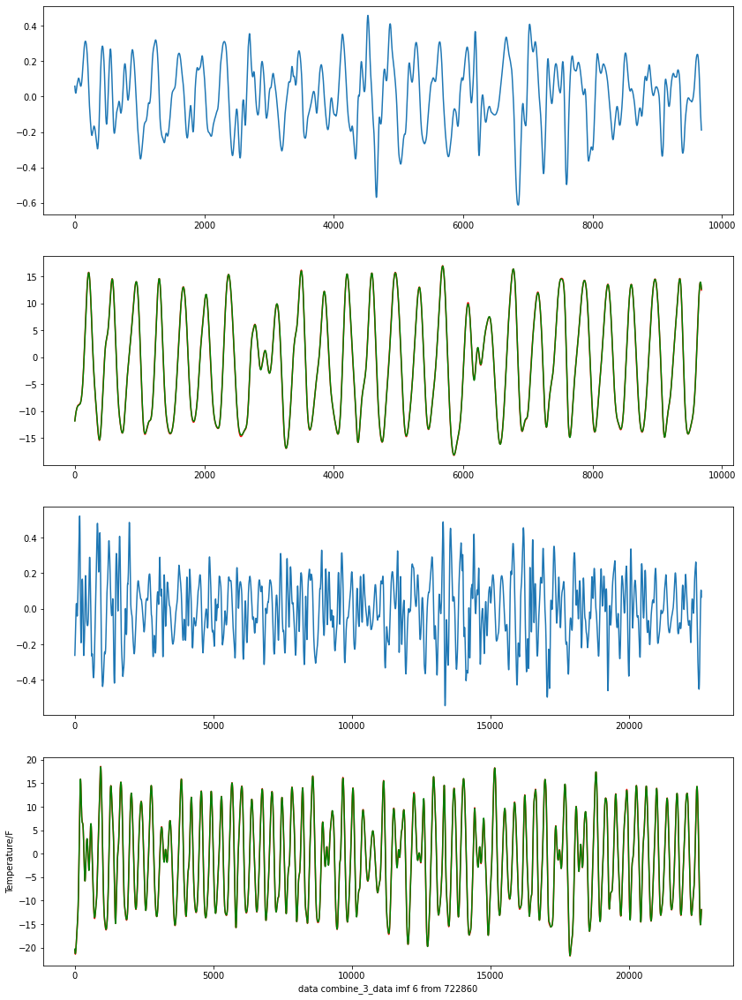

Epoch:2
MSE
TRAIN:0.03009390028075838	TEST:0.03524705739152801
Base_line:0.028481375078935063	DIFFERENT:0.006765682312592947
TARGET:-0.009493791692978355
Epoch:3
MSE
TRAIN:0.03009390028075838	TEST:0.03524705739152801
Base_line:0.028481375078935063	DIFFERENT:0.006765682312592947
TARGET:-0.014240687539467532
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 730us/step - loss: 0.5922
Epoch 2/25
707/707 [==============================] - 1s 723us/step - loss: 0.5947
Epoch 3/25
707/707 [==============================] - 1s 711us/step - loss: 0.5839
Epoch 4/25
707/707 [==============================] - 1s 732us/step - loss: 0.5828
Epoch 5/25
707/707 [==============================] - 1s 713us/step - loss: 0.6009
Epoch 6/25
707/707 [==============================] - 1s 725us/step - loss: 0.5828
Epoch 7/25
707/707 [==============================] - 1s 743us/step - loss: 0.5677
Epoch 8/25
707/707 [==============================] - 0s 706us/step - loss: 0.5678
Epoch 9/25
707/707

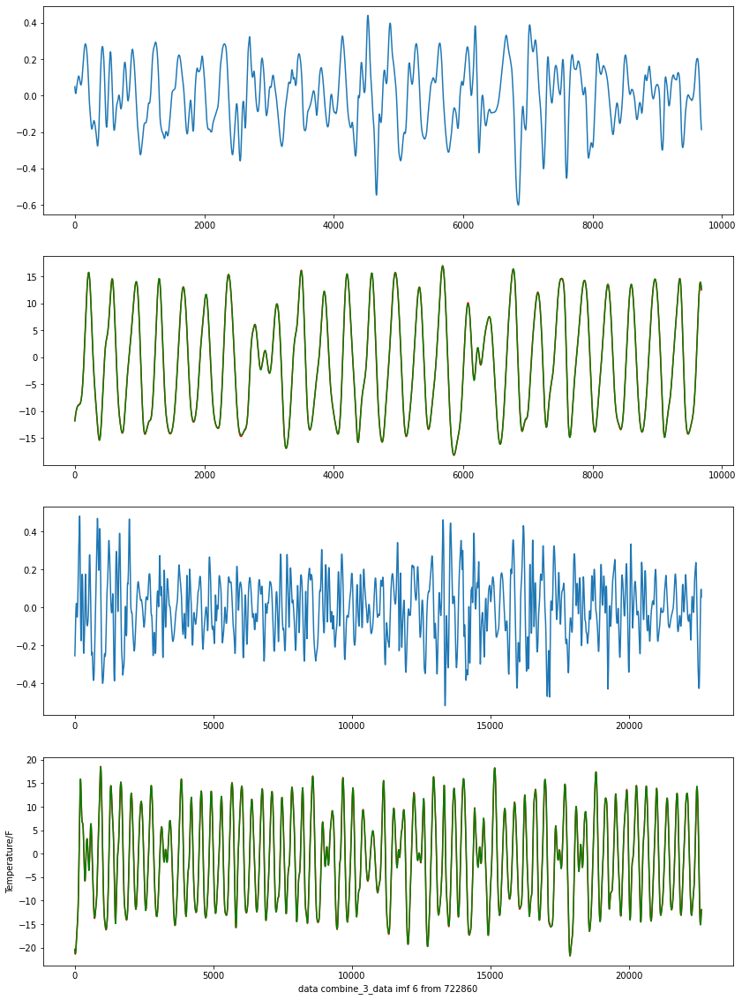

Epoch:3
MSE
TRAIN:0.026331266207159466	TEST:0.030818555240834353
Base_line:0.028481375078935063	DIFFERENT:0.0023371801618992903
TARGET:-0.014240687539467532
Epoch:4
MSE
TRAIN:0.026331266207159466	TEST:0.030818555240834353
Base_line:0.028481375078935063	DIFFERENT:0.0023371801618992903
TARGET:-0.028481375078935063
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 815us/step - loss: 0.5476
Epoch 2/25
707/707 [==============================] - 1s 720us/step - loss: 0.5412
Epoch 3/25
707/707 [==============================] - 0s 707us/step - loss: 0.5219
Epoch 4/25
707/707 [==============================] - 1s 708us/step - loss: 0.5226
Epoch 5/25
707/707 [==============================] - 1s 757us/step - loss: 0.5420
Epoch 6/25
707/707 [==============================] - 1s 723us/step - loss: 0.5299
Epoch 7/25
707/707 [==============================] - 1s 716us/step - loss: 0.5109
Epoch 8/25
707/707 [==============================] - 1s 723us/step - loss: 0.5137
Epoch 9/25
7

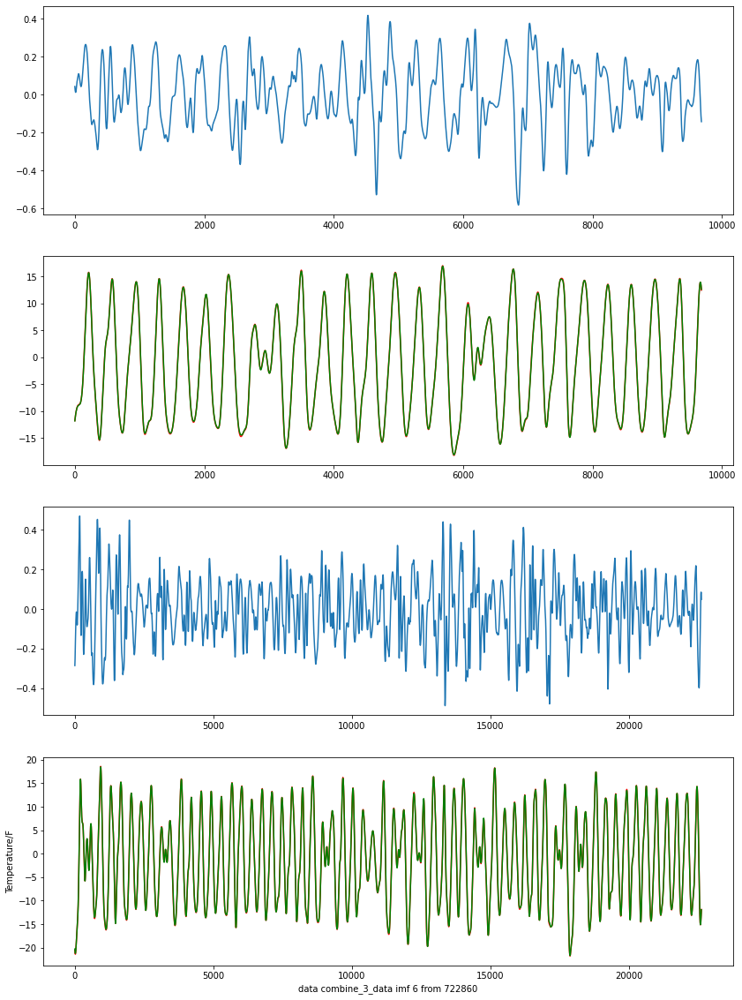

Epoch:4
MSE
TRAIN:0.02408802916798061	TEST:0.028143587905058602
Base_line:0.028481375078935063	DIFFERENT:0.00033778717387646096
TARGET:-0.028481375078935063
Epoch:5
MSE
TRAIN:0.02408802916798061	TEST:0.028143587905058602
Base_line:0.028481375078935063	DIFFERENT:0.00033778717387646096
TARGET:inf
重新训练25次
Epoch 1/25
184/707 [======>.......................] - ETA: 0s - loss: 0.4900

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in double_scalars


707/707 [==============================] - 1s 810us/step - loss: 0.4916
Epoch 2/25
707/707 [==============================] - 1s 759us/step - loss: 0.4838
Epoch 3/25
707/707 [==============================] - 1s 728us/step - loss: 0.4922
Epoch 4/25
707/707 [==============================] - 0s 705us/step - loss: 0.4886
Epoch 5/25
707/707 [==============================] - 1s 721us/step - loss: 0.4769
Epoch 6/25
707/707 [==============================] - 1s 730us/step - loss: 0.4777
Epoch 7/25
707/707 [==============================] - 1s 719us/step - loss: 0.4867
Epoch 8/25
707/707 [==============================] - 1s 721us/step - loss: 0.4640
Epoch 9/25
707/707 [==============================] - 1s 718us/step - loss: 0.4887
Epoch 10/25
707/707 [==============================] - 1s 741us/step - loss: 0.4775
Epoch 11/25
707/707 [==============================] - 1s 799us/step - loss: 0.4778
Epoch 12/25
707/707 [==============================] - 1s 722us/step - loss: 0.4818
Epoch 13/25


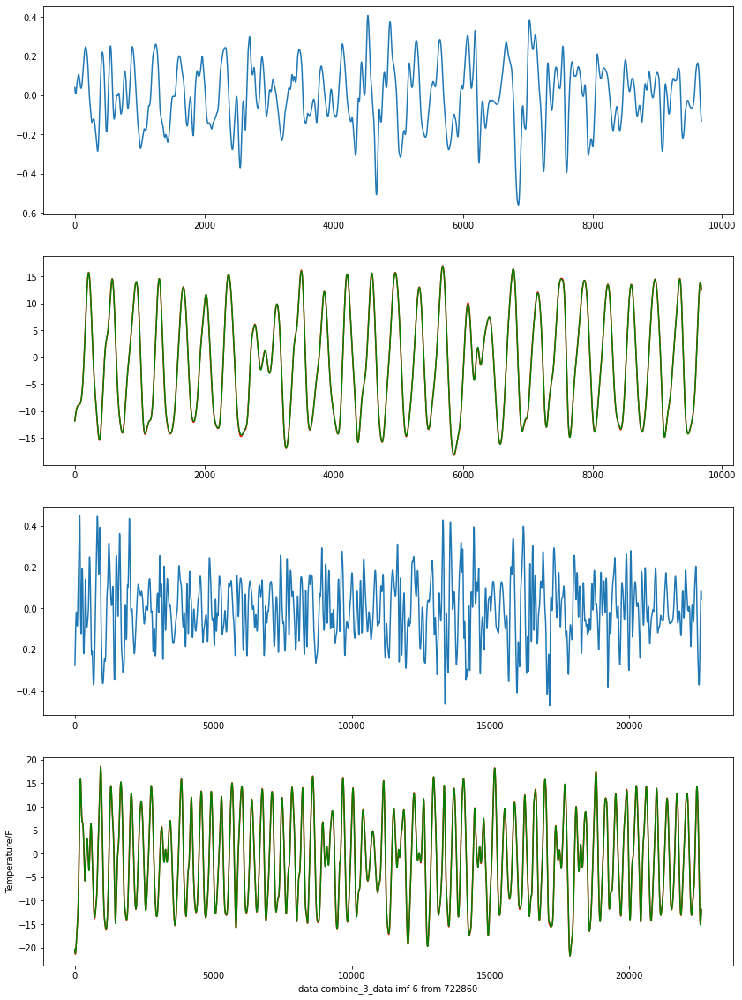

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: divide by zero encountered in double_scalars
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars


Epoch:5
MSE
TRAIN:0.022000165152862704	TEST:0.02546101783669244
Base_line:0.028481375078935063	DIFFERENT:0.003020357242242623
TARGET:inf
INFO:tensorflow:Assets written to: ./tf_model_3in1_params_1628050912.707525/722860_combine_3_data_imf6.params/assets
-------------------------------------------------------------------
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 21)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2816      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_______________________________________________________________

707/707 [==============================] - 1s 722us/step - loss: 0.7572
Epoch 81/100
707/707 [==============================] - 1s 733us/step - loss: 0.7162
Epoch 82/100
707/707 [==============================] - 1s 708us/step - loss: 0.6858
Epoch 83/100
707/707 [==============================] - 0s 702us/step - loss: 0.7167
Epoch 84/100
707/707 [==============================] - 1s 715us/step - loss: 0.6943
Epoch 85/100
707/707 [==============================] - 1s 719us/step - loss: 0.6729
Epoch 86/100
707/707 [==============================] - 1s 759us/step - loss: 0.6995
Epoch 87/100
707/707 [==============================] - 1s 769us/step - loss: 0.6855
Epoch 88/100
707/707 [==============================] - 1s 721us/step - loss: 0.6862
Epoch 89/100
707/707 [==============================] - 1s 709us/step - loss: 0.6769
Epoch 90/100
707/707 [==============================] - 1s 710us/step - loss: 0.6593
Epoch 91/100
707/707 [==============================] - 1s 738us/step - loss: 

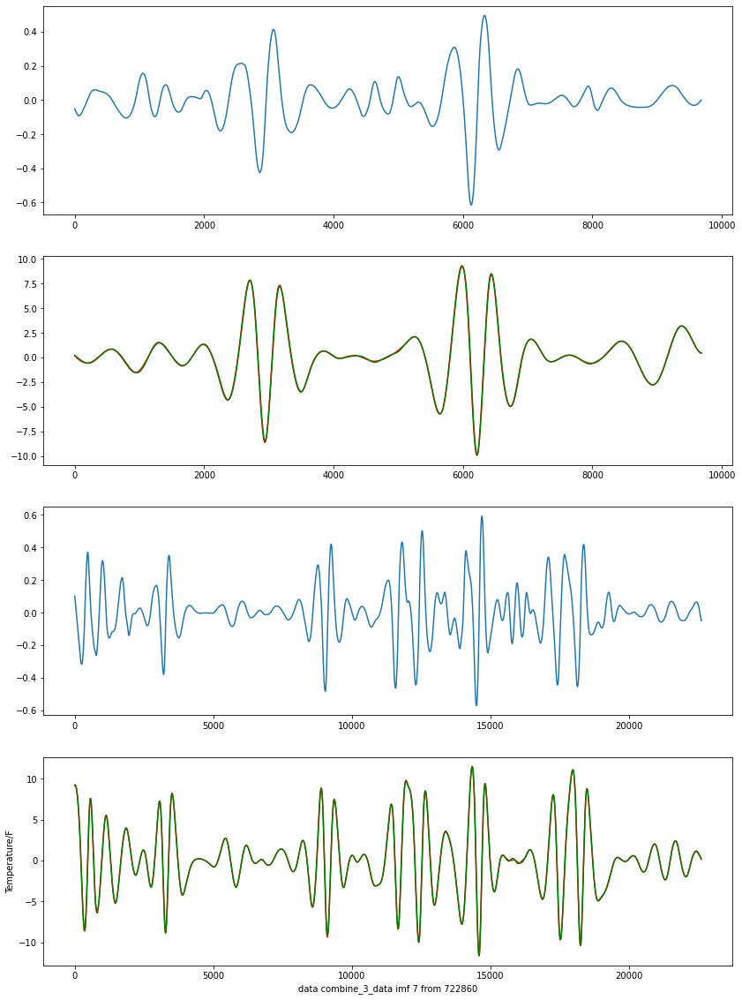

Epoch:1
MSE
TRAIN:0.025463077061238303	TEST:0.019019080109779988
Base_line:0.0014871773411797432	DIFFERENT:0.017531902768600244
TARGET:-0.00029743546823594863
Epoch:2
MSE
TRAIN:0.025463077061238303	TEST:0.019019080109779988
Base_line:0.0014871773411797432	DIFFERENT:0.017531902768600244
TARGET:-0.0003717943352949358
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 734us/step - loss: 0.4874
Epoch 2/25
707/707 [==============================] - 1s 742us/step - loss: 0.4887
Epoch 3/25
707/707 [==============================] - 1s 714us/step - loss: 0.4706
Epoch 4/25
707/707 [==============================] - 1s 717us/step - loss: 0.4630
Epoch 5/25
707/707 [==============================] - 1s 776us/step - loss: 0.4794
Epoch 6/25
707/707 [==============================] - 1s 757us/step - loss: 0.4686
Epoch 7/25
707/707 [==============================] - 1s 724us/step - loss: 0.4609
Epoch 8/25
707/707 [==============================] - 1s 708us/step - loss: 0.4789
Epoch 9/2

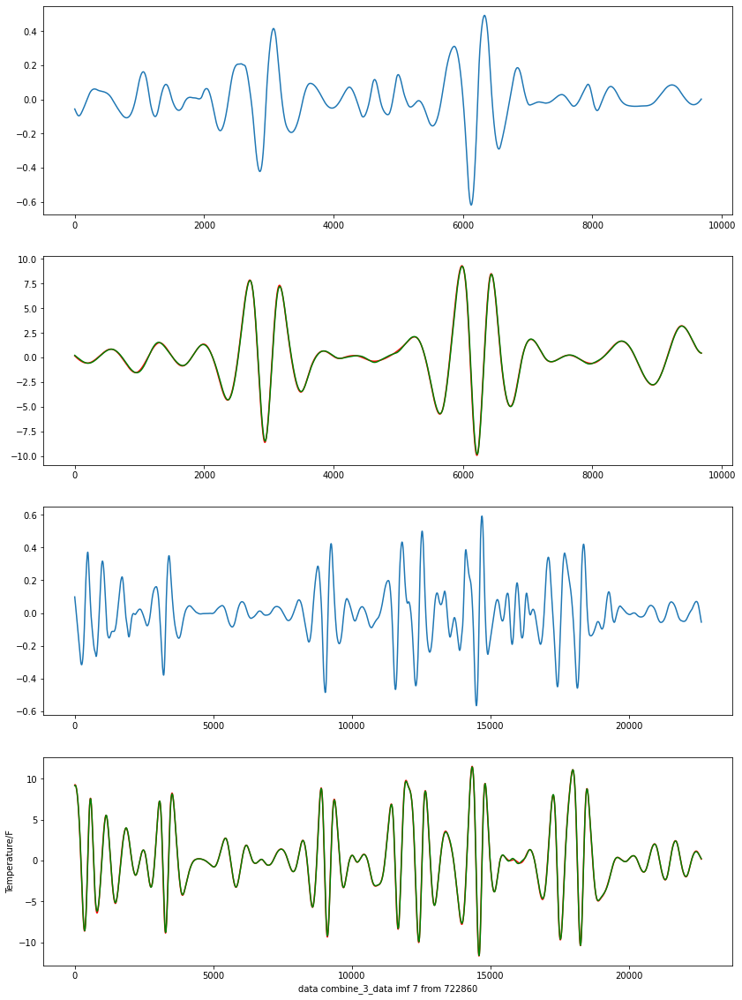

Epoch:2
MSE
TRAIN:0.02544311419608546	TEST:0.019159616920258412
Base_line:0.0014871773411797432	DIFFERENT:0.01767243957907867
TARGET:-0.0003717943352949358
Epoch:3
MSE
TRAIN:0.02544311419608546	TEST:0.019159616920258412
Base_line:0.0014871773411797432	DIFFERENT:0.01767243957907867
TARGET:-0.0004957257803932478
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 755us/step - loss: 0.4120
Epoch 2/25
707/707 [==============================] - 1s 714us/step - loss: 0.4046
Epoch 3/25
707/707 [==============================] - 1s 717us/step - loss: 0.4057
Epoch 4/25
707/707 [==============================] - 1s 707us/step - loss: 0.4045
Epoch 5/25
707/707 [==============================] - 1s 706us/step - loss: 0.4021
Epoch 6/25
707/707 [==============================] - 1s 771us/step - loss: 0.4026
Epoch 7/25
707/707 [==============================] - 1s 756us/step - loss: 0.3992
Epoch 8/25
707/707 [==============================] - 0s 706us/step - loss: 0.4035
Epoch 9/25
707

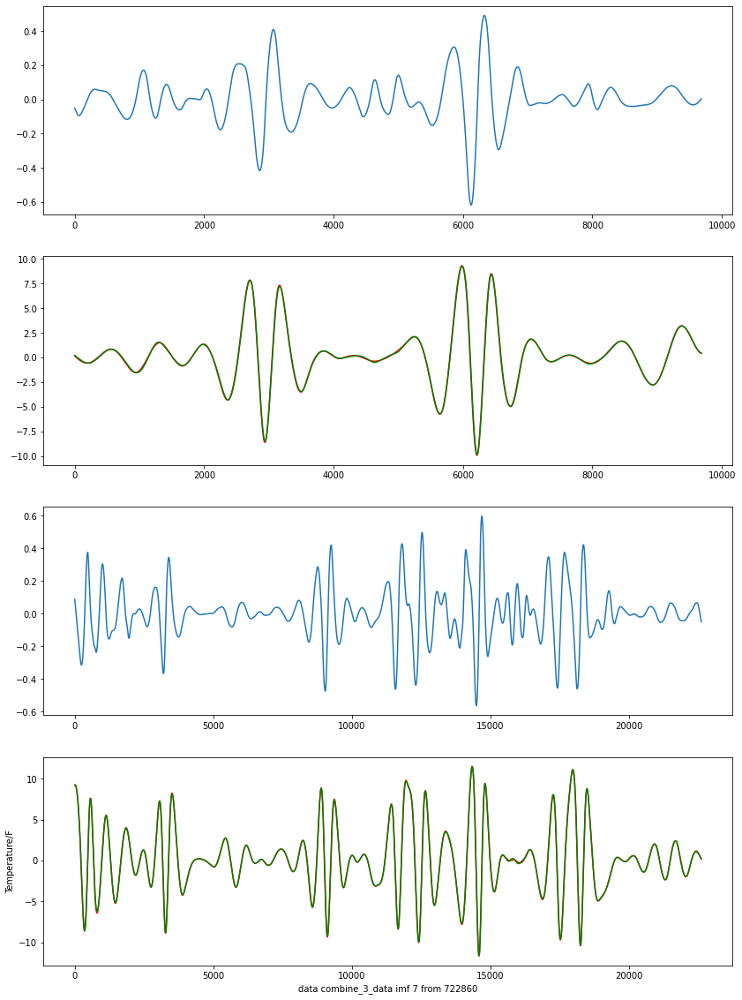

Epoch:3
MSE
TRAIN:0.02521902045561676	TEST:0.01902336384913329
Base_line:0.0014871773411797432	DIFFERENT:0.017536186507953546
TARGET:-0.0004957257803932478
Epoch:4
MSE
TRAIN:0.02521902045561676	TEST:0.01902336384913329
Base_line:0.0014871773411797432	DIFFERENT:0.017536186507953546
TARGET:-0.0007435886705898716
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 718us/step - loss: 0.3539
Epoch 2/25
707/707 [==============================] - 1s 742us/step - loss: 0.3507
Epoch 3/25
707/707 [==============================] - 1s 725us/step - loss: 0.3578
Epoch 4/25
707/707 [==============================] - 1s 712us/step - loss: 0.3385
Epoch 5/25
707/707 [==============================] - 1s 709us/step - loss: 0.3430
Epoch 6/25
707/707 [==============================] - 1s 733us/step - loss: 0.3477
Epoch 7/25
707/707 [==============================] - 1s 773us/step - loss: 0.3415
Epoch 8/25
707/707 [==============================] - 1s 754us/step - loss: 0.3394
Epoch 9/25
707

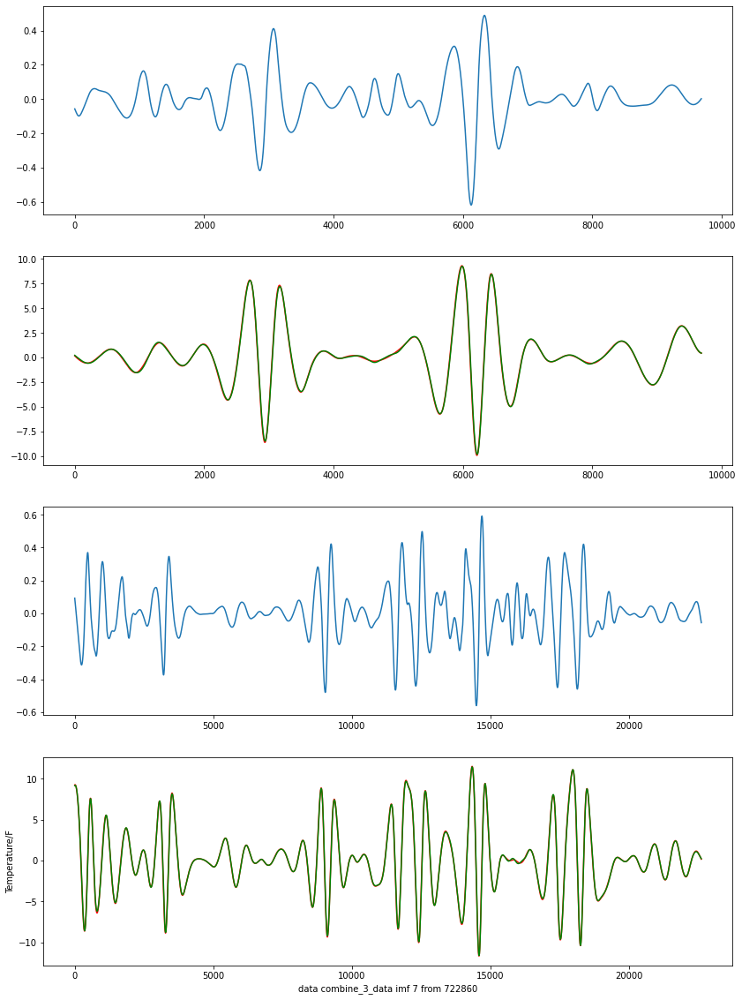

Epoch:4
MSE
TRAIN:0.025250663843536948	TEST:0.019091327200365802
Base_line:0.0014871773411797432	DIFFERENT:0.01760414985918606
TARGET:-0.0007435886705898716
Epoch:5
MSE
TRAIN:0.025250663843536948	TEST:0.019091327200365802
Base_line:0.0014871773411797432	DIFFERENT:0.01760414985918606
TARGET:-0.0014871773411797432
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 714us/step - loss: 0.3095
Epoch 2/25
707/707 [==============================] - 1s 720us/step - loss: 0.3016
Epoch 3/25
707/707 [==============================] - 1s 732us/step - loss: 0.3087
Epoch 4/25
707/707 [==============================] - 1s 724us/step - loss: 0.3033
Epoch 5/25
707/707 [==============================] - 1s 763us/step - loss: 0.3041
Epoch 6/25
707/707 [==============================] - 1s 720us/step - loss: 0.3090
Epoch 7/25
707/707 [==============================] - 1s 719us/step - loss: 0.3009
Epoch 8/25
707/707 [==============================] - 1s 776us/step - loss: 0.3054
Epoch 9/25
7

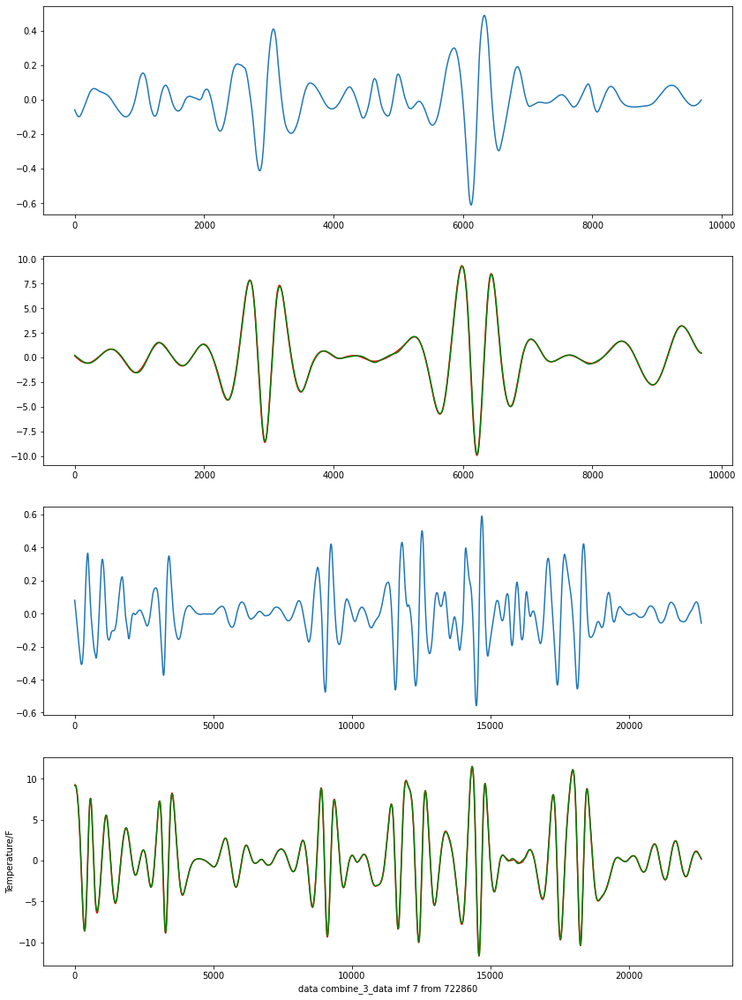

Epoch:5
MSE
TRAIN:0.024973466225858516	TEST:0.01880649426628658
Base_line:0.0014871773411797432	DIFFERENT:0.017319316925106836
TARGET:-0.0014871773411797432
Epoch:6
MSE
TRAIN:0.024973466225858516	TEST:0.01880649426628658
Base_line:0.0014871773411797432	DIFFERENT:0.017319316925106836
TARGET:inf
重新训练25次
Epoch 1/25
200/707 [=======>......................] - ETA: 0s - loss: 0.2823

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in double_scalars


707/707 [==============================] - 1s 723us/step - loss: 0.2809
Epoch 2/25
707/707 [==============================] - 1s 718us/step - loss: 0.2781
Epoch 3/25
707/707 [==============================] - 1s 719us/step - loss: 0.2779
Epoch 4/25
707/707 [==============================] - 1s 732us/step - loss: 0.2733
Epoch 5/25
707/707 [==============================] - 0s 704us/step - loss: 0.2712
Epoch 6/25
707/707 [==============================] - 1s 722us/step - loss: 0.2740
Epoch 7/25
707/707 [==============================] - 1s 720us/step - loss: 0.2743
Epoch 8/25
707/707 [==============================] - 1s 720us/step - loss: 0.2717
Epoch 9/25
707/707 [==============================] - 1s 771us/step - loss: 0.2658
Epoch 10/25
707/707 [==============================] - 1s 768us/step - loss: 0.2685
Epoch 11/25
707/707 [==============================] - 1s 725us/step - loss: 0.2659
Epoch 12/25
707/707 [==============================] - 1s 725us/step - loss: 0.2620
Epoch 13/25


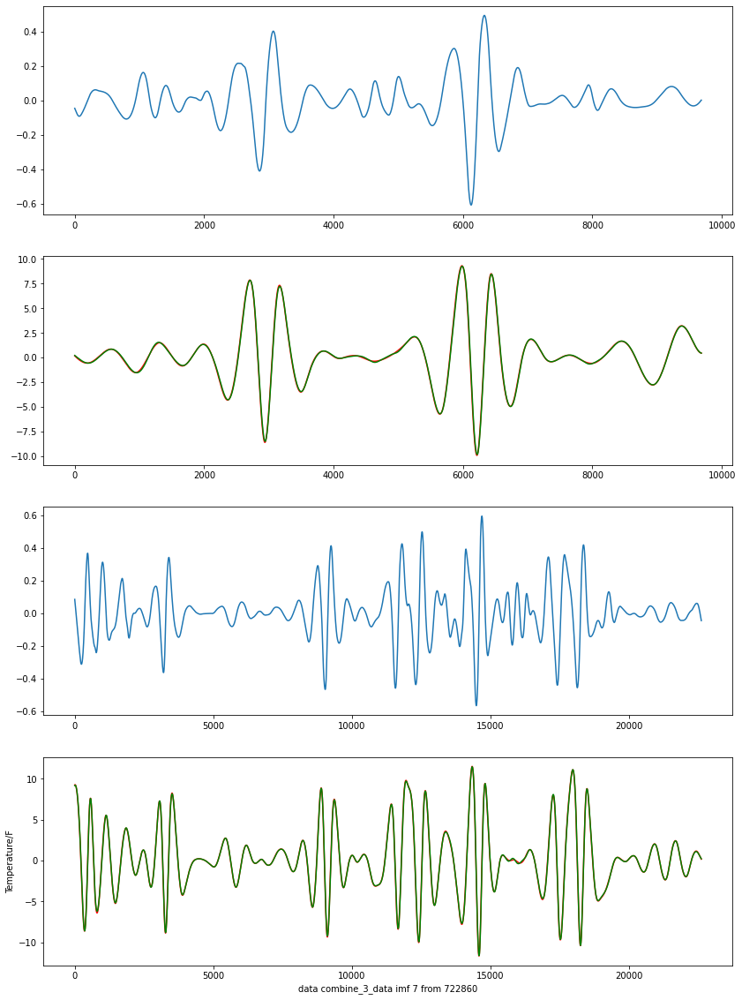

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: divide by zero encountered in double_scalars
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars


Epoch:6
MSE
TRAIN:0.02486374009498175	TEST:0.018599859873811995
Base_line:0.0014871773411797432	DIFFERENT:0.01711268253263225
TARGET:inf
INFO:tensorflow:Assets written to: ./tf_model_3in1_params_1628050912.707525/722860_combine_3_data_imf7.params/assets
-------------------------------------------------------------------
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 21)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2816      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_______________________________________________________________

707/707 [==============================] - 1s 732us/step - loss: 0.2295
Epoch 81/100
707/707 [==============================] - 0s 700us/step - loss: 0.2289
Epoch 82/100
707/707 [==============================] - 1s 716us/step - loss: 0.2287
Epoch 83/100
707/707 [==============================] - 0s 700us/step - loss: 0.2319
Epoch 84/100
707/707 [==============================] - 1s 711us/step - loss: 0.2303
Epoch 85/100
707/707 [==============================] - 1s 756us/step - loss: 0.2287
Epoch 86/100
707/707 [==============================] - 1s 763us/step - loss: 0.2317
Epoch 87/100
707/707 [==============================] - 1s 716us/step - loss: 0.2339
Epoch 88/100
707/707 [==============================] - 0s 702us/step - loss: 0.2263
Epoch 89/100
707/707 [==============================] - 0s 695us/step - loss: 0.2314
Epoch 90/100
707/707 [==============================] - 1s 727us/step - loss: 0.2225
Epoch 91/100
707/707 [==============================] - 0s 701us/step - loss: 

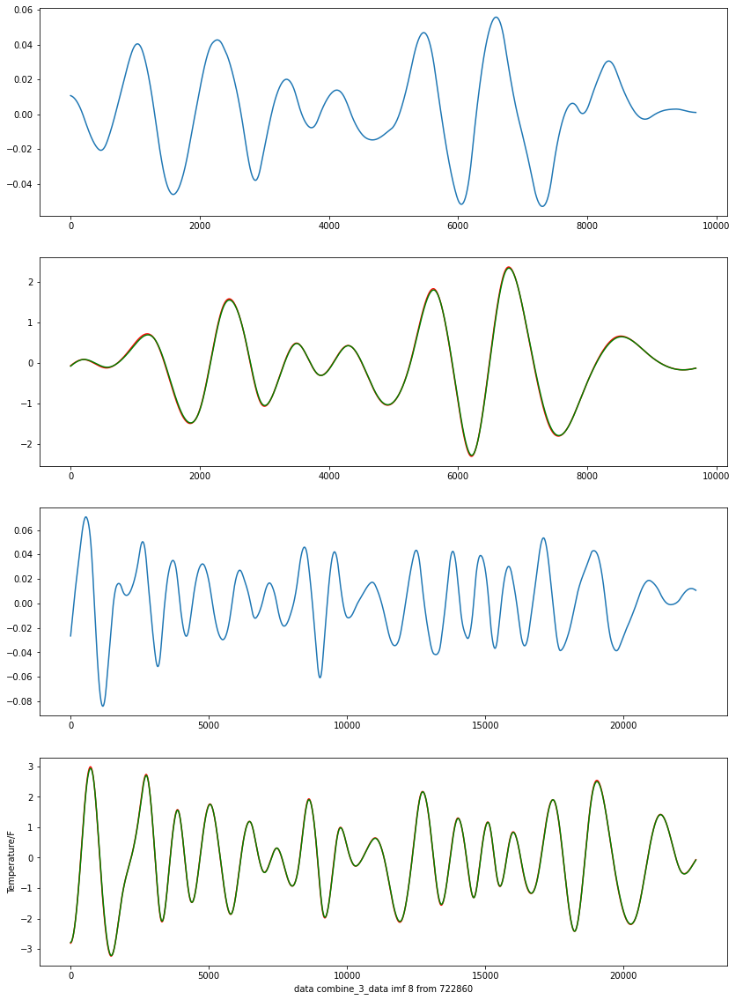

Epoch:1
MSE
TRAIN:0.0007446444371435843	TEST:0.000613376812887755
Base_line:2.6448952494603093e-05	DIFFERENT:0.0005869278603931519
TARGET:-4.4081587491005155e-06
Epoch:2
MSE
TRAIN:0.0007446444371435843	TEST:0.000613376812887755
Base_line:2.6448952494603093e-05	DIFFERENT:0.0005869278603931519
TARGET:-5.289790498920619e-06
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 735us/step - loss: 0.2063
Epoch 2/25
707/707 [==============================] - 1s 722us/step - loss: 0.2075
Epoch 3/25
707/707 [==============================] - 1s 717us/step - loss: 0.2088
Epoch 4/25
707/707 [==============================] - 1s 774us/step - loss: 0.2093
Epoch 5/25
707/707 [==============================] - 1s 818us/step - loss: 0.2099
Epoch 6/25
707/707 [==============================] - 1s 727us/step - loss: 0.2050
Epoch 7/25
707/707 [==============================] - 1s 723us/step - loss: 0.2068
Epoch 8/25
707/707 [==============================] - 1s 719us/step - loss: 0.2078
Epo

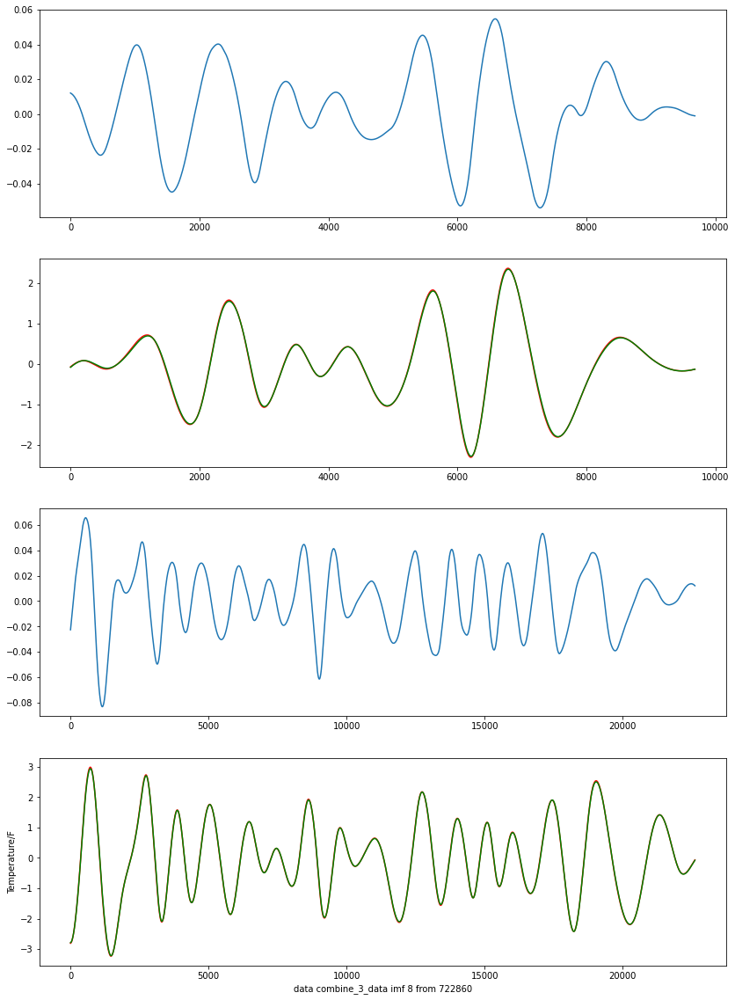

Epoch:2
MSE
TRAIN:0.0007025716900081065	TEST:0.0006014620738921611
Base_line:2.6448952494603093e-05	DIFFERENT:0.000575013121397558
TARGET:-5.289790498920619e-06
Epoch:3
MSE
TRAIN:0.0007025716900081065	TEST:0.0006014620738921611
Base_line:2.6448952494603093e-05	DIFFERENT:0.000575013121397558
TARGET:-6.612238123650773e-06
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 862us/step - loss: 0.1992
Epoch 2/25
707/707 [==============================] - 1s 993us/step - loss: 0.2026
Epoch 3/25
707/707 [==============================] - 1s 866us/step - loss: 0.2013
Epoch 4/25
707/707 [==============================] - 1s 938us/step - loss: 0.1981
Epoch 5/25
707/707 [==============================] - 1s 851us/step - loss: 0.1998
Epoch 6/25
707/707 [==============================] - 1s 820us/step - loss: 0.2008
Epoch 7/25
707/707 [==============================] - 1s 824us/step - loss: 0.1967
Epoch 8/25
707/707 [==============================] - 1s 835us/step - loss: 0.1976
Epoc

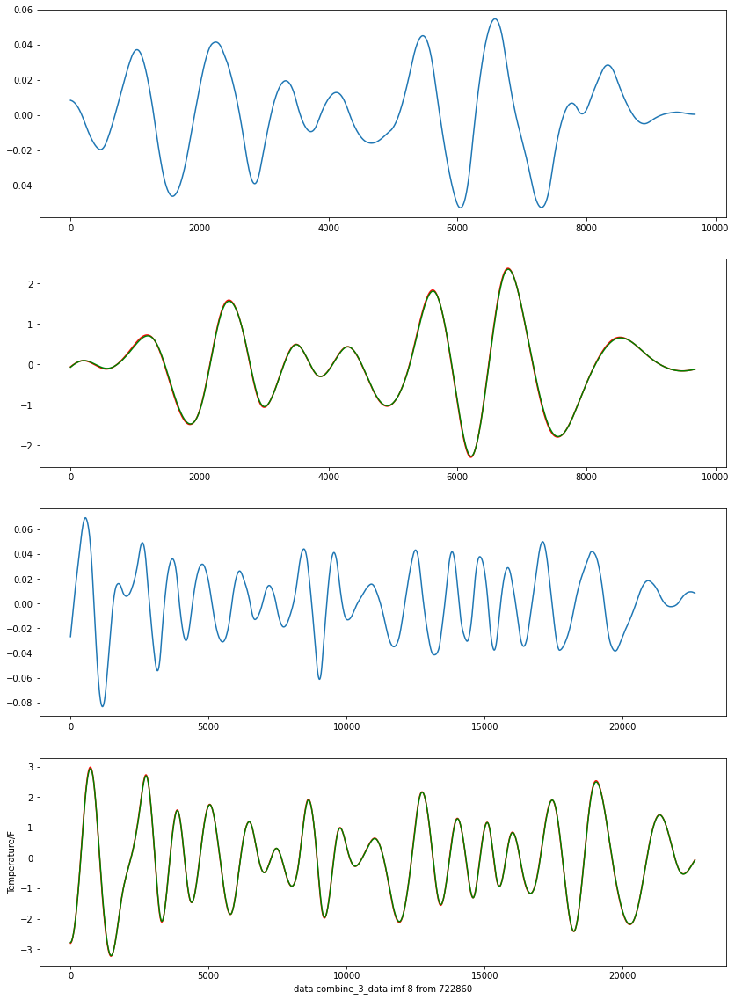

Epoch:3
MSE
TRAIN:0.0007307752397860338	TEST:0.0005900312098393956
Base_line:2.6448952494603093e-05	DIFFERENT:0.0005635822573447925
TARGET:-6.612238123650773e-06
Epoch:4
MSE
TRAIN:0.0007307752397860338	TEST:0.0005900312098393956
Base_line:2.6448952494603093e-05	DIFFERENT:0.0005635822573447925
TARGET:-8.816317498201031e-06
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 829us/step - loss: 0.1891
Epoch 2/25
707/707 [==============================] - 1s 928us/step - loss: 0.1875 0s - lo
Epoch 3/25
707/707 [==============================] - 1s 831us/step - loss: 0.1935
Epoch 4/25
707/707 [==============================] - 1s 803us/step - loss: 0.1884
Epoch 5/25
707/707 [==============================] - 1s 810us/step - loss: 0.1878
Epoch 6/25
707/707 [==============================] - 1s 846us/step - loss: 0.1886
Epoch 7/25
707/707 [==============================] - 1s 794us/step - loss: 0.1878
Epoch 8/25
707/707 [==============================] - 1s 813us/step - loss: 0

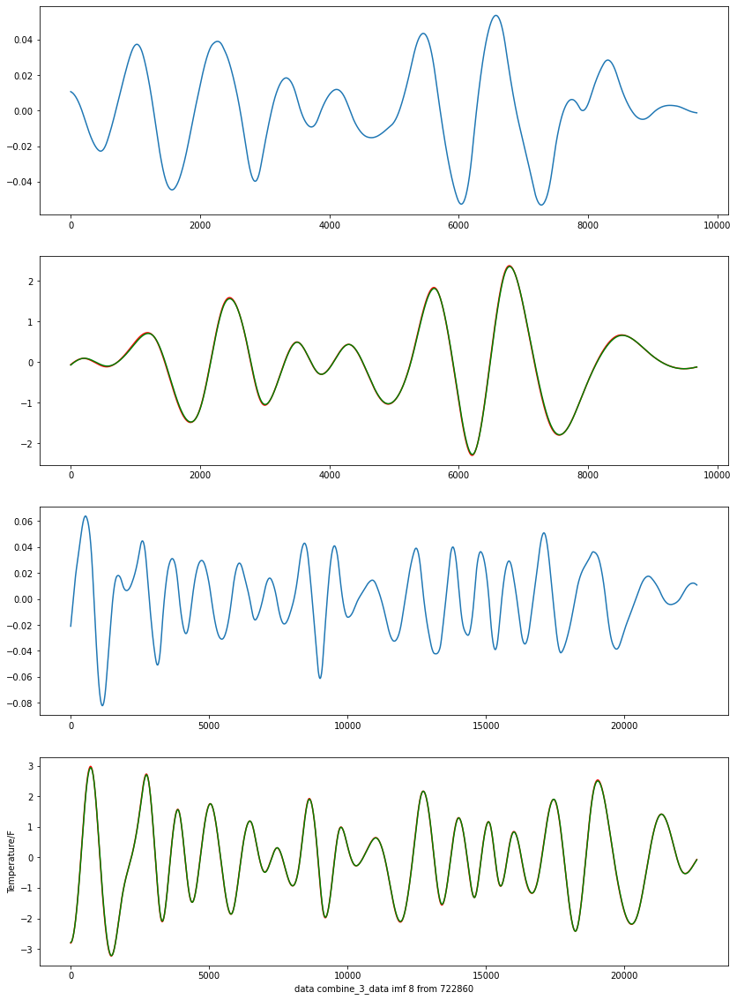

Epoch:4
MSE
TRAIN:0.0006865556965264775	TEST:0.0005770346598615989
Base_line:2.6448952494603093e-05	DIFFERENT:0.0005505857073669957
TARGET:-8.816317498201031e-06
Epoch:5
MSE
TRAIN:0.0006865556965264775	TEST:0.0005770346598615989
Base_line:2.6448952494603093e-05	DIFFERENT:0.0005505857073669957
TARGET:-1.3224476247301546e-05
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 820us/step - loss: 0.1849
Epoch 2/25
707/707 [==============================] - 1s 817us/step - loss: 0.1861
Epoch 3/25
707/707 [==============================] - 1s 798us/step - loss: 0.1871
Epoch 4/25
707/707 [==============================] - 1s 831us/step - loss: 0.1812
Epoch 5/25
707/707 [==============================] - 1s 812us/step - loss: 0.1836
Epoch 6/25
707/707 [==============================] - 1s 791us/step - loss: 0.1818
Epoch 7/25
707/707 [==============================] - 1s 798us/step - loss: 0.1820
Epoch 8/25
707/707 [==============================] - 1s 859us/step - loss: 0.1801
E

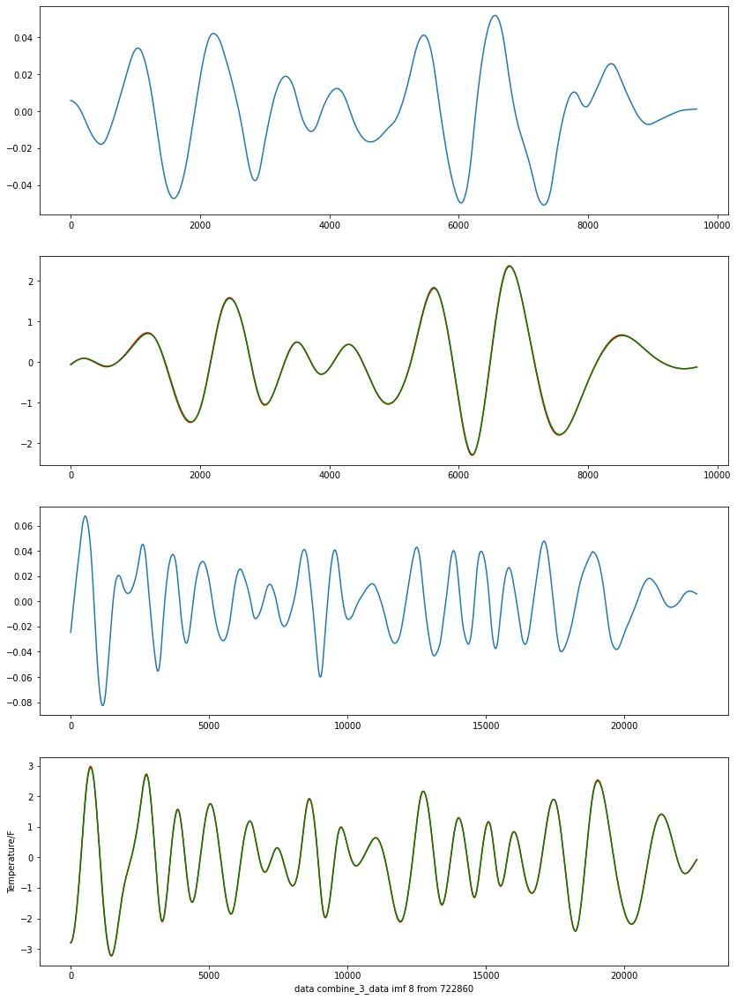

Epoch:5
MSE
TRAIN:0.0007116194439826862	TEST:0.0005494013778586758
Base_line:2.6448952494603093e-05	DIFFERENT:0.0005229524253640727
TARGET:-1.3224476247301546e-05
Epoch:6
MSE
TRAIN:0.0007116194439826862	TEST:0.0005494013778586758
Base_line:2.6448952494603093e-05	DIFFERENT:0.0005229524253640727
TARGET:-2.6448952494603093e-05
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 739us/step - loss: 0.1728
Epoch 2/25
707/707 [==============================] - 1s 761us/step - loss: 0.1740
Epoch 3/25
707/707 [==============================] - 1s 728us/step - loss: 0.1750
Epoch 4/25
707/707 [==============================] - 1s 729us/step - loss: 0.1723
Epoch 5/25
707/707 [==============================] - 1s 725us/step - loss: 0.1683
Epoch 6/25
707/707 [==============================] - 1s 721us/step - loss: 0.1711
Epoch 7/25
707/707 [==============================] - 1s 762us/step - loss: 0.1746
Epoch 8/25
707/707 [==============================] - 1s 772us/step - loss: 0.1751


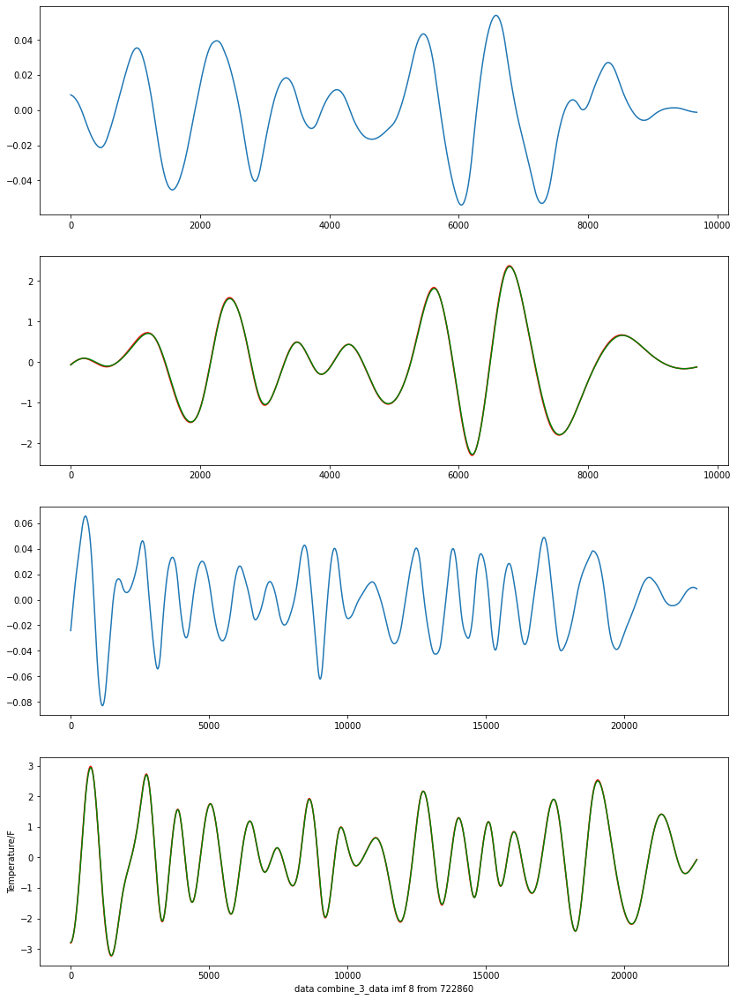

Epoch:6
MSE
TRAIN:0.0007076023960216384	TEST:0.0005810551756480595
Base_line:2.6448952494603093e-05	DIFFERENT:0.0005546062231534563
TARGET:-2.6448952494603093e-05
Epoch:7
MSE
TRAIN:0.0007076023960216384	TEST:0.0005810551756480595
Base_line:2.6448952494603093e-05	DIFFERENT:0.0005546062231534563
TARGET:inf
重新训练25次
Epoch 1/25
164/707 [=====>........................] - ETA: 0s - loss: 0.1717

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in double_scalars


707/707 [==============================] - 1s 782us/step - loss: 0.1671
Epoch 2/25
707/707 [==============================] - 1s 794us/step - loss: 0.1652
Epoch 3/25
707/707 [==============================] - 1s 763us/step - loss: 0.1664
Epoch 4/25
707/707 [==============================] - 1s 761us/step - loss: 0.1648
Epoch 5/25
707/707 [==============================] - 1s 761us/step - loss: 0.1641
Epoch 6/25
707/707 [==============================] - 1s 761us/step - loss: 0.1652
Epoch 7/25
707/707 [==============================] - 1s 839us/step - loss: 0.1629
Epoch 8/25
707/707 [==============================] - 1s 883us/step - loss: 0.1649
Epoch 9/25
707/707 [==============================] - 1s 775us/step - loss: 0.1666
Epoch 10/25
707/707 [==============================] - 1s 815us/step - loss: 0.1669
Epoch 11/25
707/707 [==============================] - 1s 838us/step - loss: 0.1659
Epoch 12/25
707/707 [==============================] - 1s 770us/step - loss: 0.1629
Epoch 13/25


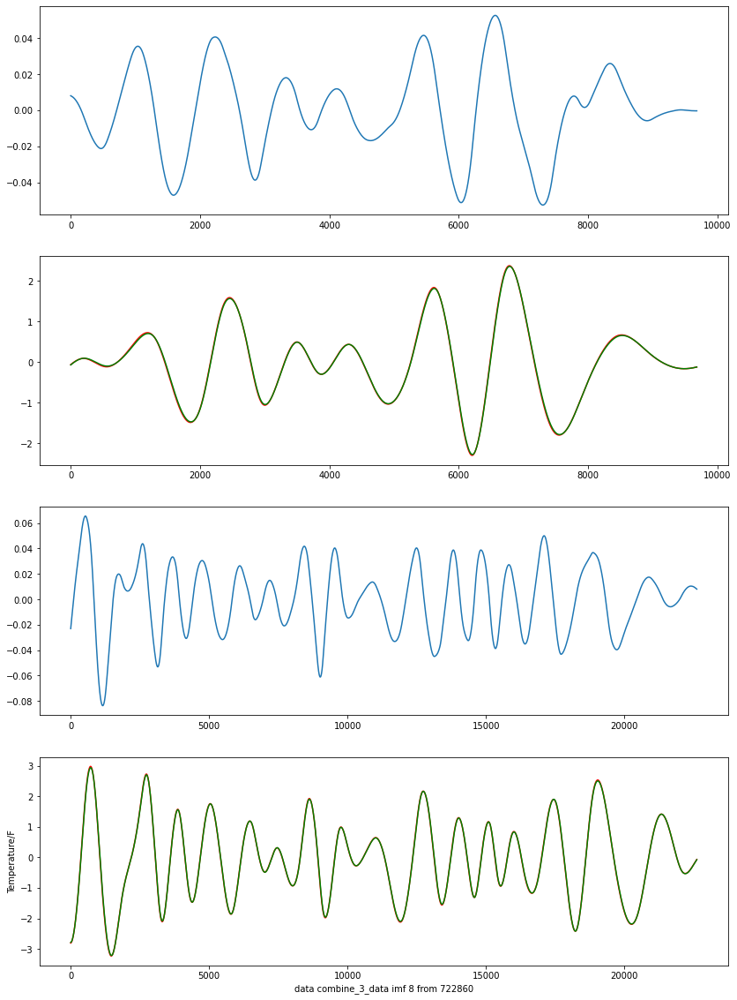

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: divide by zero encountered in double_scalars
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars


Epoch:7
MSE
TRAIN:0.0007125676694748292	TEST:0.0005666383588946417
Base_line:2.6448952494603093e-05	DIFFERENT:0.0005401894064000386
TARGET:inf
INFO:tensorflow:Assets written to: ./tf_model_3in1_params_1628050912.707525/722860_combine_3_data_imf8.params/assets
-------------------------------------------------------------------
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 21)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2816      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________

707/707 [==============================] - 1s 756us/step - loss: 0.2242
Epoch 81/100
707/707 [==============================] - 1s 764us/step - loss: 0.2223
Epoch 82/100
707/707 [==============================] - 1s 724us/step - loss: 0.2161
Epoch 83/100
707/707 [==============================] - 1s 720us/step - loss: 0.2182
Epoch 84/100
707/707 [==============================] - 1s 712us/step - loss: 0.2215
Epoch 85/100
707/707 [==============================] - 1s 749us/step - loss: 0.2230
Epoch 86/100
707/707 [==============================] - 0s 704us/step - loss: 0.2171
Epoch 87/100
707/707 [==============================] - 1s 709us/step - loss: 0.2131
Epoch 88/100
707/707 [==============================] - 0s 705us/step - loss: 0.2109
Epoch 89/100
707/707 [==============================] - 1s 1ms/step - loss: 0.2218
Epoch 90/100
707/707 [==============================] - 1s 1ms/step - loss: 0.2192
Epoch 91/100
707/707 [==============================] - 1s 1ms/step - loss: 0.2211

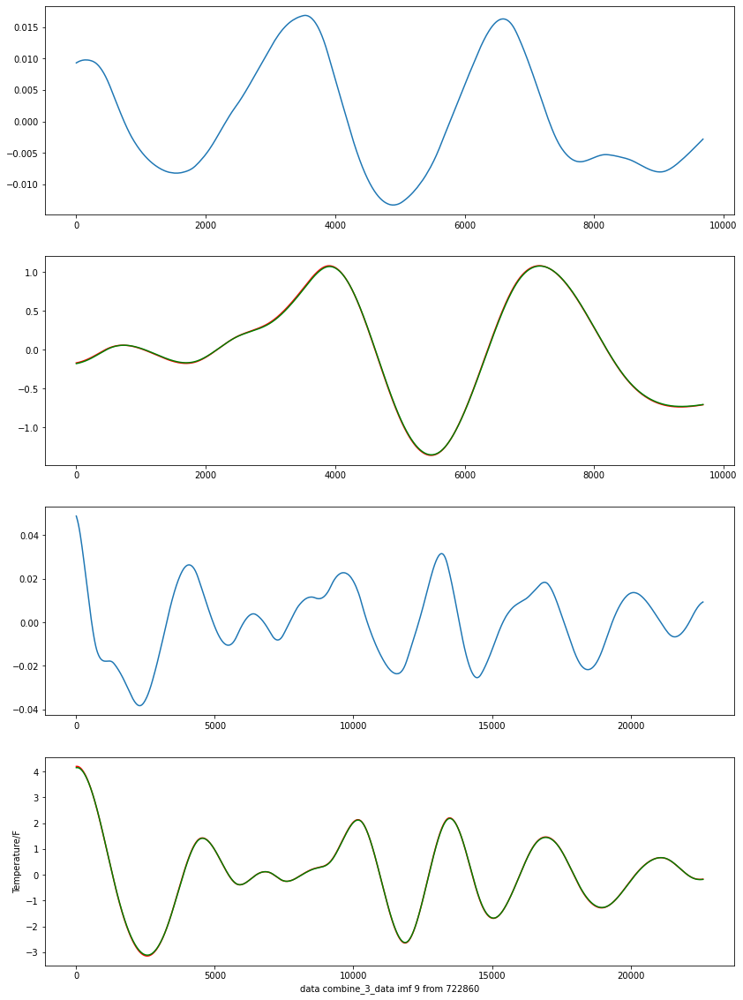

Epoch:1
MSE
TRAIN:0.00026643328690447387	TEST:7.883982105413696e-05
Base_line:3.6792638293796152e-06	DIFFERENT:7.516055722475735e-05
TARGET:-5.256091184828021e-07
Epoch:2
MSE
TRAIN:0.00026643328690447387	TEST:7.883982105413696e-05
Base_line:3.6792638293796152e-06	DIFFERENT:7.516055722475735e-05
TARGET:-6.132106382299358e-07
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 728us/step - loss: 0.1996
Epoch 2/25
707/707 [==============================] - 1s 737us/step - loss: 0.1963
Epoch 3/25
707/707 [==============================] - 1s 757us/step - loss: 0.1955 0s - loss: 0.196
Epoch 4/25
707/707 [==============================] - 1s 709us/step - loss: 0.1962
Epoch 5/25
707/707 [==============================] - 1s 722us/step - loss: 0.1948
Epoch 6/25
707/707 [==============================] - 1s 728us/step - loss: 0.1934
Epoch 7/25
707/707 [==============================] - 1s 759us/step - loss: 0.1920
Epoch 8/25
707/707 [==============================] - 1s 768us/ste

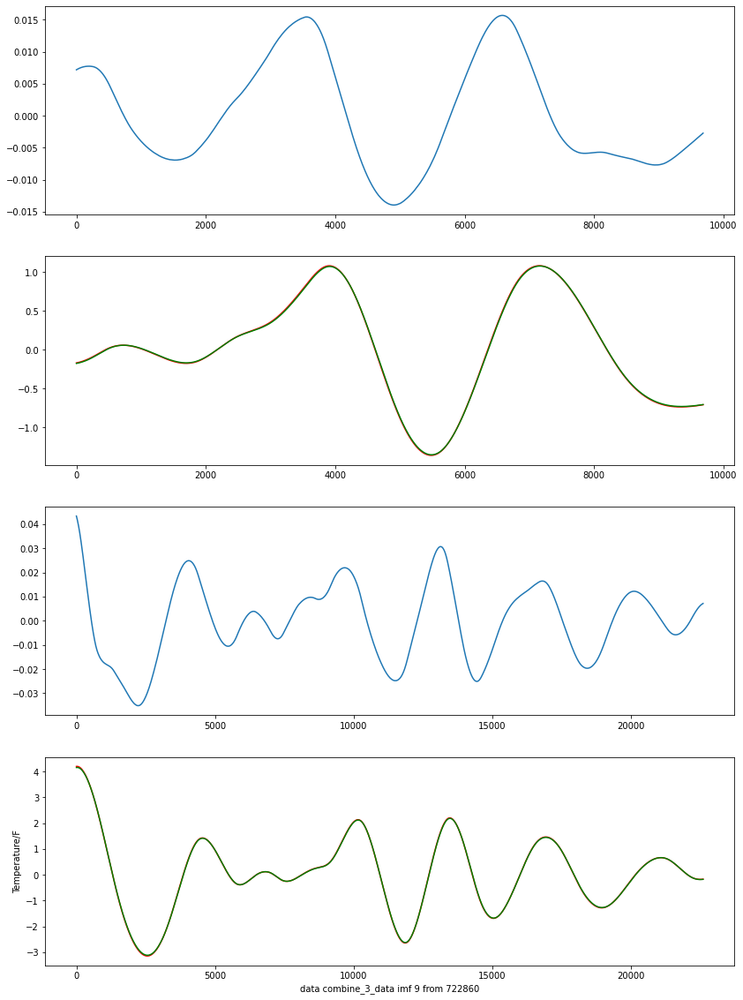

Epoch:2
MSE
TRAIN:0.00024210635801745272	TEST:7.018002563650749e-05
Base_line:3.6792638293796152e-06	DIFFERENT:6.650076180712788e-05
TARGET:-6.132106382299358e-07
Epoch:3
MSE
TRAIN:0.00024210635801745272	TEST:7.018002563650749e-05
Base_line:3.6792638293796152e-06	DIFFERENT:6.650076180712788e-05
TARGET:-7.35852765875923e-07
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 734us/step - loss: 0.1864
Epoch 2/25
707/707 [==============================] - 0s 702us/step - loss: 0.1891
Epoch 3/25
707/707 [==============================] - 1s 735us/step - loss: 0.1836
Epoch 4/25
707/707 [==============================] - 1s 717us/step - loss: 0.1838
Epoch 5/25
707/707 [==============================] - 1s 728us/step - loss: 0.1810
Epoch 6/25
707/707 [==============================] - 1s 716us/step - loss: 0.1855
Epoch 7/25
707/707 [==============================] - 0s 704us/step - loss: 0.1844
Epoch 8/25
707/707 [==============================] - 1s 787us/step - loss: 0.1856
E

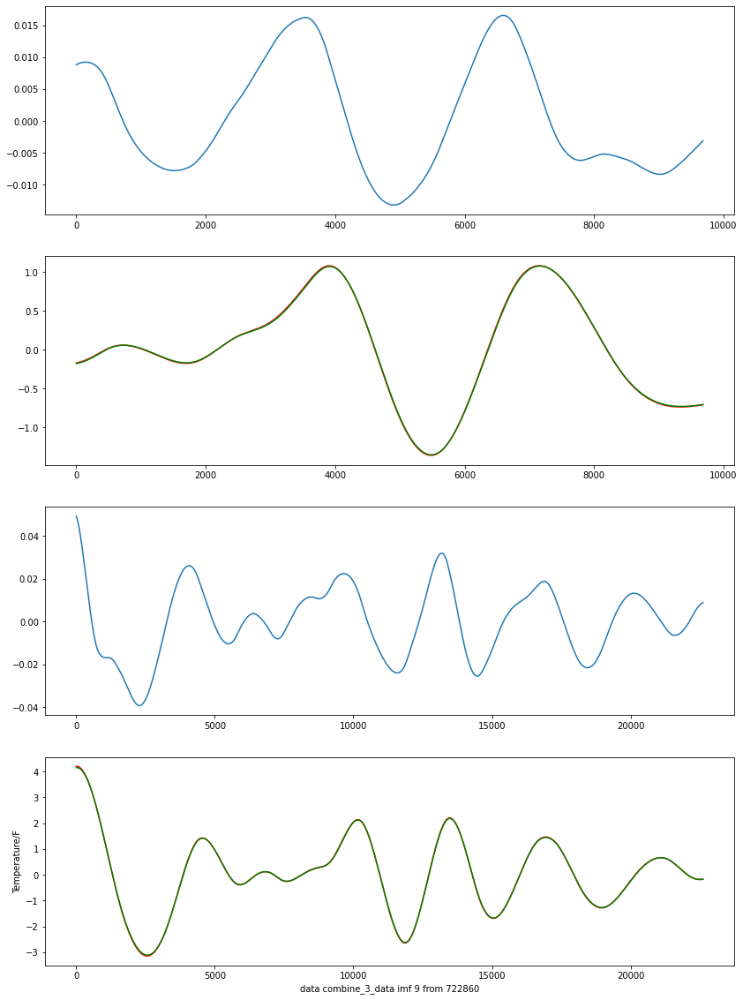

Epoch:3
MSE
TRAIN:0.00026862340363206815	TEST:7.651734297104944e-05
Base_line:3.6792638293796152e-06	DIFFERENT:7.283807914166983e-05
TARGET:-7.35852765875923e-07
Epoch:4
MSE
TRAIN:0.00026862340363206815	TEST:7.651734297104944e-05
Base_line:3.6792638293796152e-06	DIFFERENT:7.283807914166983e-05
TARGET:-9.198159573449038e-07
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 807us/step - loss: 0.1735
Epoch 2/25
707/707 [==============================] - 1s 801us/step - loss: 0.1828
Epoch 3/25
707/707 [==============================] - 1s 773us/step - loss: 0.1792
Epoch 4/25
707/707 [==============================] - 1s 783us/step - loss: 0.1777
Epoch 5/25
707/707 [==============================] - 1s 760us/step - loss: 0.1777
Epoch 6/25
707/707 [==============================] - 1s 749us/step - loss: 0.1748
Epoch 7/25
707/707 [==============================] - 1s 759us/step - loss: 0.1767
Epoch 8/25
707/707 [==============================] - 1s 777us/step - loss: 0.1775
E

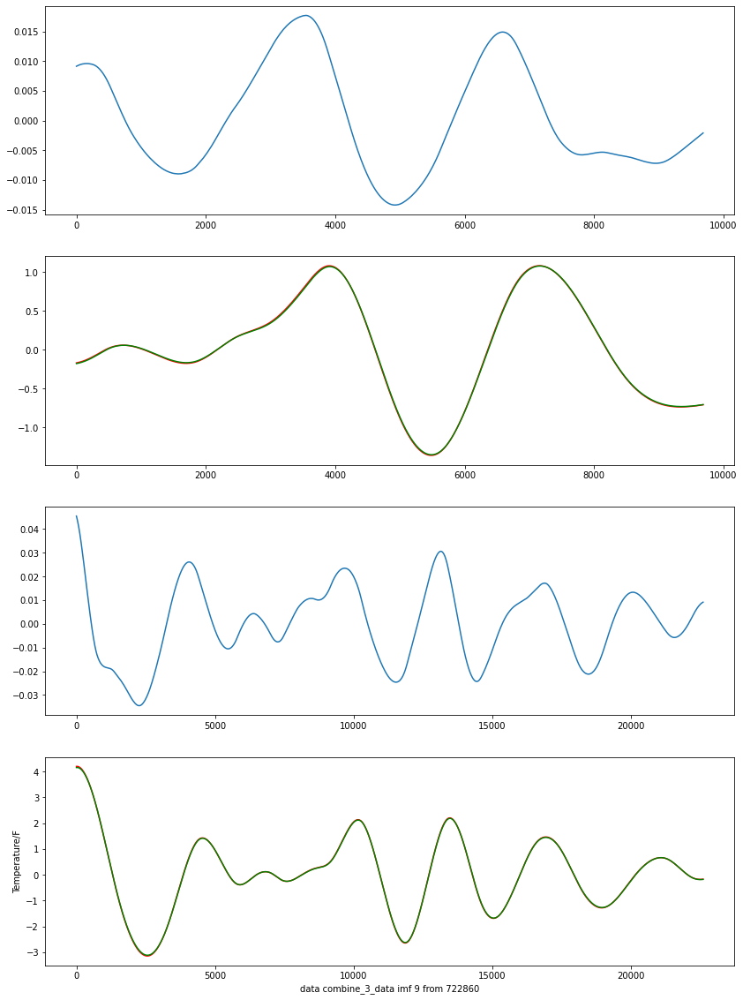

Epoch:4
MSE
TRAIN:0.0002484157859437632	TEST:7.928364222945516e-05
Base_line:3.6792638293796152e-06	DIFFERENT:7.560437840007555e-05
TARGET:-9.198159573449038e-07
Epoch:5
MSE
TRAIN:0.0002484157859437632	TEST:7.928364222945516e-05
Base_line:3.6792638293796152e-06	DIFFERENT:7.560437840007555e-05
TARGET:-1.2264212764598717e-06
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 731us/step - loss: 0.1683
Epoch 2/25
707/707 [==============================] - 1s 725us/step - loss: 0.1721
Epoch 3/25
707/707 [==============================] - 1s 716us/step - loss: 0.1704
Epoch 4/25
707/707 [==============================] - 1s 746us/step - loss: 0.1665
Epoch 5/25
707/707 [==============================] - 1s 776us/step - loss: 0.1670
Epoch 6/25
707/707 [==============================] - 1s 749us/step - loss: 0.1699
Epoch 7/25
707/707 [==============================] - 1s 729us/step - loss: 0.1696
Epoch 8/25
707/707 [==============================] - 1s 755us/step - loss: 0.1701
E

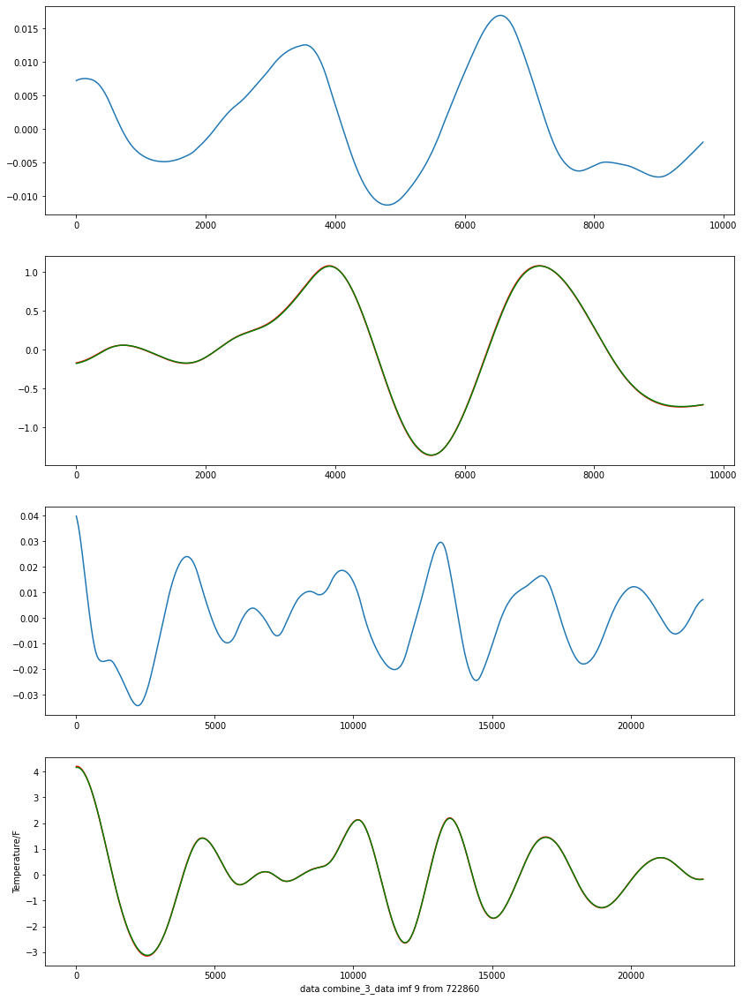

Epoch:5
MSE
TRAIN:0.00021086113664431512	TEST:5.851540757524354e-05
Base_line:3.6792638293796152e-06	DIFFERENT:5.483614374586392e-05
TARGET:-1.2264212764598717e-06
Epoch:6
MSE
TRAIN:0.00021086113664431512	TEST:5.851540757524354e-05
Base_line:3.6792638293796152e-06	DIFFERENT:5.483614374586392e-05
TARGET:-1.8396319146898076e-06
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 755us/step - loss: 0.1620
Epoch 2/25
707/707 [==============================] - 1s 732us/step - loss: 0.1646
Epoch 3/25
707/707 [==============================] - 1s 713us/step - loss: 0.1572
Epoch 4/25
707/707 [==============================] - 1s 727us/step - loss: 0.1569
Epoch 5/25
707/707 [==============================] - 1s 716us/step - loss: 0.1561
Epoch 6/25
707/707 [==============================] - 1s 711us/step - loss: 0.1598
Epoch 7/25
707/707 [==============================] - 1s 718us/step - loss: 0.1592
Epoch 8/25
707/707 [==============================] - 0s 706us/step - loss: 0.158

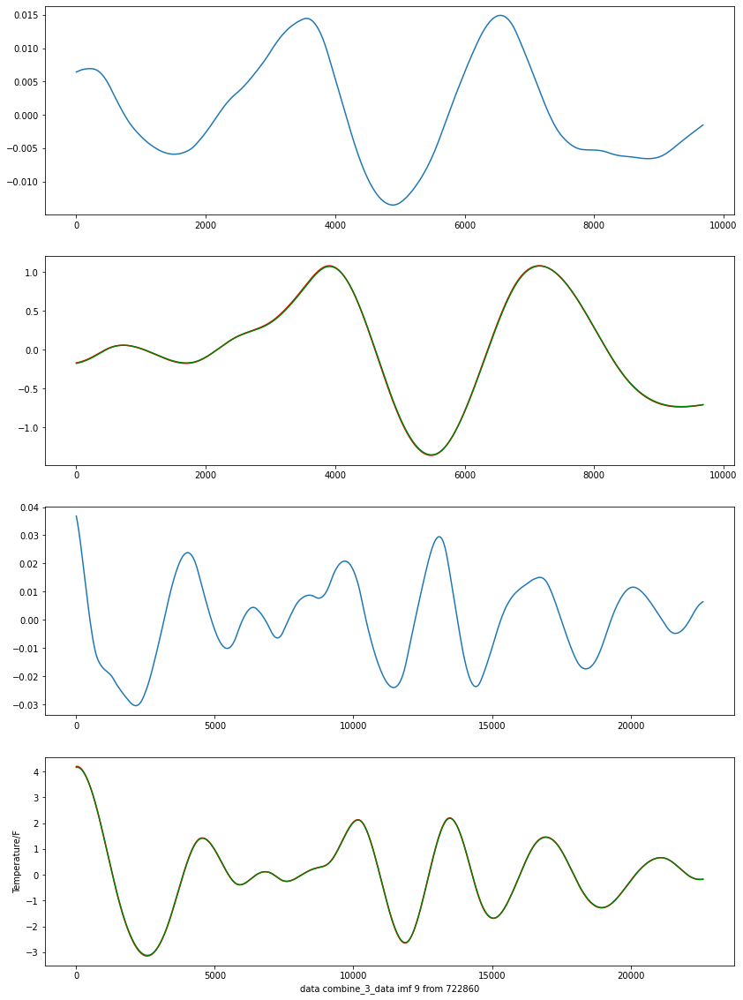

Epoch:6
MSE
TRAIN:0.0002070583253363081	TEST:6.121872281604107e-05
Base_line:3.6792638293796152e-06	DIFFERENT:5.753945898666145e-05
TARGET:-1.8396319146898076e-06
Epoch:7
MSE
TRAIN:0.0002070583253363081	TEST:6.121872281604107e-05
Base_line:3.6792638293796152e-06	DIFFERENT:5.753945898666145e-05
TARGET:-3.6792638293796152e-06
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 778us/step - loss: 0.1559
Epoch 2/25
707/707 [==============================] - 1s 765us/step - loss: 0.1554
Epoch 3/25
707/707 [==============================] - 0s 703us/step - loss: 0.1496
Epoch 4/25
707/707 [==============================] - 1s 727us/step - loss: 0.1495
Epoch 5/25
707/707 [==============================] - 1s 722us/step - loss: 0.1514
Epoch 6/25
707/707 [==============================] - 1s 737us/step - loss: 0.1488
Epoch 7/25
707/707 [==============================] - 1s 717us/step - loss: 0.1485
Epoch 8/25
707/707 [==============================] - 1s 722us/step - loss: 0.1503


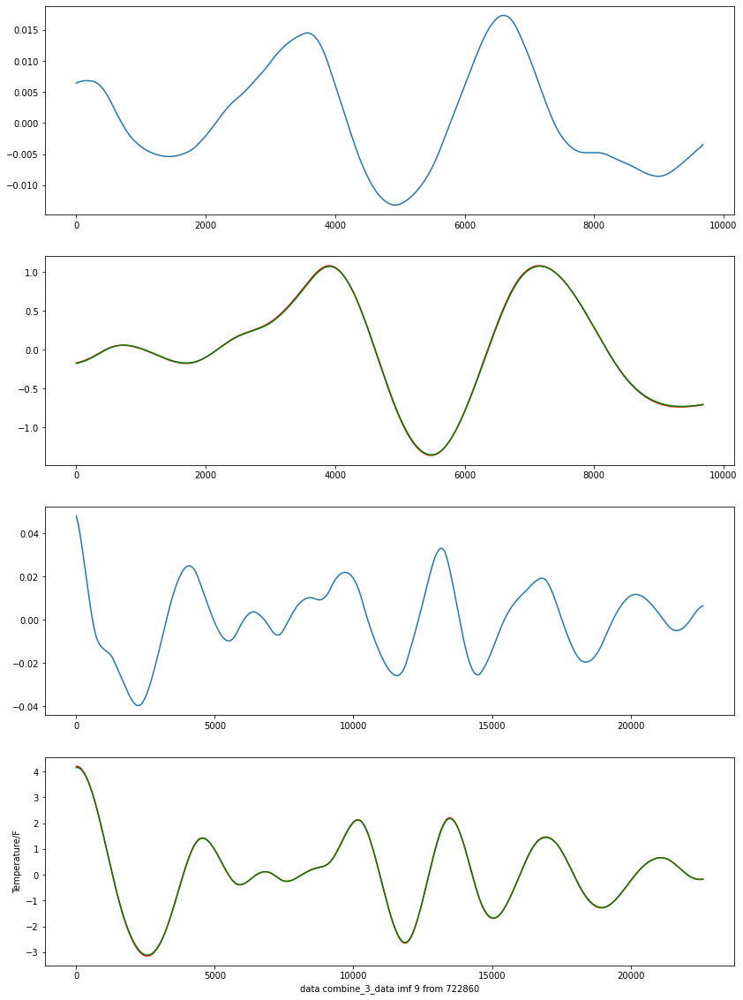

Epoch:7
MSE
TRAIN:0.0002677083274483706	TEST:6.940647066169825e-05
Base_line:3.6792638293796152e-06	DIFFERENT:6.572720683231864e-05
TARGET:-3.6792638293796152e-06
Epoch:8
MSE
TRAIN:0.0002677083274483706	TEST:6.940647066169825e-05
Base_line:3.6792638293796152e-06	DIFFERENT:6.572720683231864e-05
TARGET:inf
重新训练25次
Epoch 1/25
200/707 [=======>......................] - ETA: 0s - loss: 0.1465

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in double_scalars


707/707 [==============================] - 1s 730us/step - loss: 0.1443
Epoch 2/25
707/707 [==============================] - 1s 779us/step - loss: 0.1424
Epoch 3/25
707/707 [==============================] - 1s 762us/step - loss: 0.1471
Epoch 4/25
707/707 [==============================] - 1s 725us/step - loss: 0.1466
Epoch 5/25
707/707 [==============================] - 1s 717us/step - loss: 0.1454
Epoch 6/25
707/707 [==============================] - 1s 734us/step - loss: 0.1406
Epoch 7/25
707/707 [==============================] - 1s 721us/step - loss: 0.1430
Epoch 8/25
707/707 [==============================] - 1s 712us/step - loss: 0.1444
Epoch 9/25
707/707 [==============================] - 1s 823us/step - loss: 0.1406
Epoch 10/25
707/707 [==============================] - 1s 770us/step - loss: 0.1431
Epoch 11/25
707/707 [==============================] - 1s 761us/step - loss: 0.1418
Epoch 12/25
707/707 [==============================] - 1s 788us/step - loss: 0.1450
Epoch 13/25


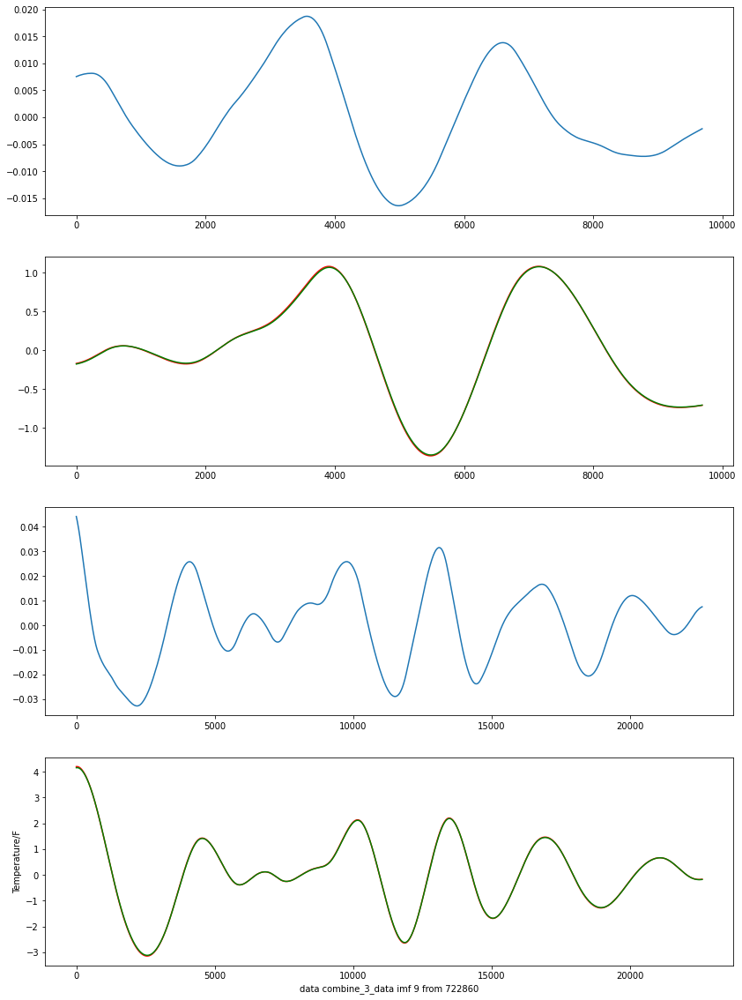

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: divide by zero encountered in double_scalars
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars


Epoch:8
MSE
TRAIN:0.0002557237511339794	TEST:8.404396623677926e-05
Base_line:3.6792638293796152e-06	DIFFERENT:8.036470240739965e-05
TARGET:inf
INFO:tensorflow:Assets written to: ./tf_model_3in1_params_1628050912.707525/722860_combine_3_data_imf9.params/assets
-------------------------------------------------------------------
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 21)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2816      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________

707/707 [==============================] - 1s 717us/step - loss: 0.1311 0s - loss: 
Epoch 80/100
707/707 [==============================] - 1s 724us/step - loss: 0.1334
Epoch 81/100
707/707 [==============================] - 1s 744us/step - loss: 0.1305
Epoch 82/100
707/707 [==============================] - 0s 707us/step - loss: 0.1277
Epoch 83/100
707/707 [==============================] - 1s 726us/step - loss: 0.1271
Epoch 84/100
707/707 [==============================] - 1s 715us/step - loss: 0.1301
Epoch 85/100
707/707 [==============================] - 1s 722us/step - loss: 0.1273
Epoch 86/100
707/707 [==============================] - 1s 767us/step - loss: 0.1284
Epoch 87/100
707/707 [==============================] - 1s 775us/step - loss: 0.1287
Epoch 88/100
707/707 [==============================] - 1s 758us/step - loss: 0.1253
Epoch 89/100
707/707 [==============================] - 1s 734us/step - loss: 0.1289
Epoch 90/100
707/707 [==============================] - 1s 724us/s

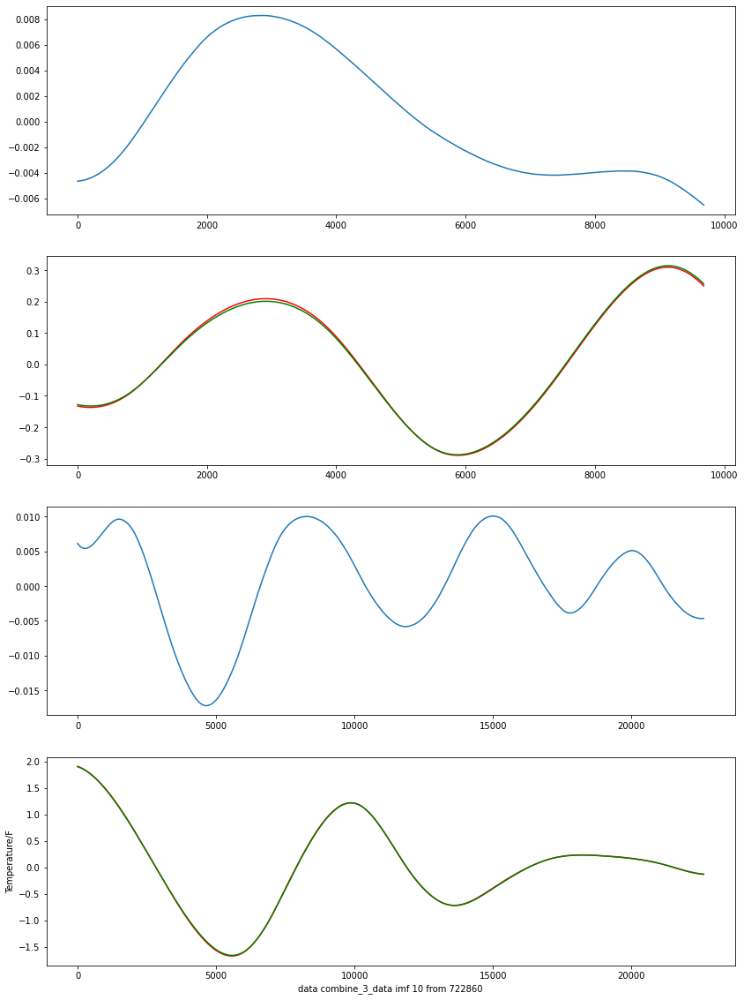

Epoch:1
MSE
TRAIN:5.2296891050702606e-05	TEST:2.2834058212574608e-05
Base_line:2.1258414877566902e-07	DIFFERENT:2.2621474063798937e-05
TARGET:-2.6573018596958627e-08
Epoch:2
MSE
TRAIN:5.2296891050702606e-05	TEST:2.2834058212574608e-05
Base_line:2.1258414877566902e-07	DIFFERENT:2.2621474063798937e-05
TARGET:-3.036916411080986e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 724us/step - loss: 0.1189
Epoch 2/25
707/707 [==============================] - 1s 752us/step - loss: 0.1157
Epoch 3/25
707/707 [==============================] - 1s 745us/step - loss: 0.1159
Epoch 4/25
707/707 [==============================] - 1s 764us/step - loss: 0.1183
Epoch 5/25
707/707 [==============================] - 1s 764us/step - loss: 0.1172
Epoch 6/25
707/707 [==============================] - 1s 725us/step - loss: 0.1184
Epoch 7/25
707/707 [==============================] - 1s 717us/step - loss: 0.1166
Epoch 8/25
707/707 [==============================] - 1s 743us/step - loss: 0.

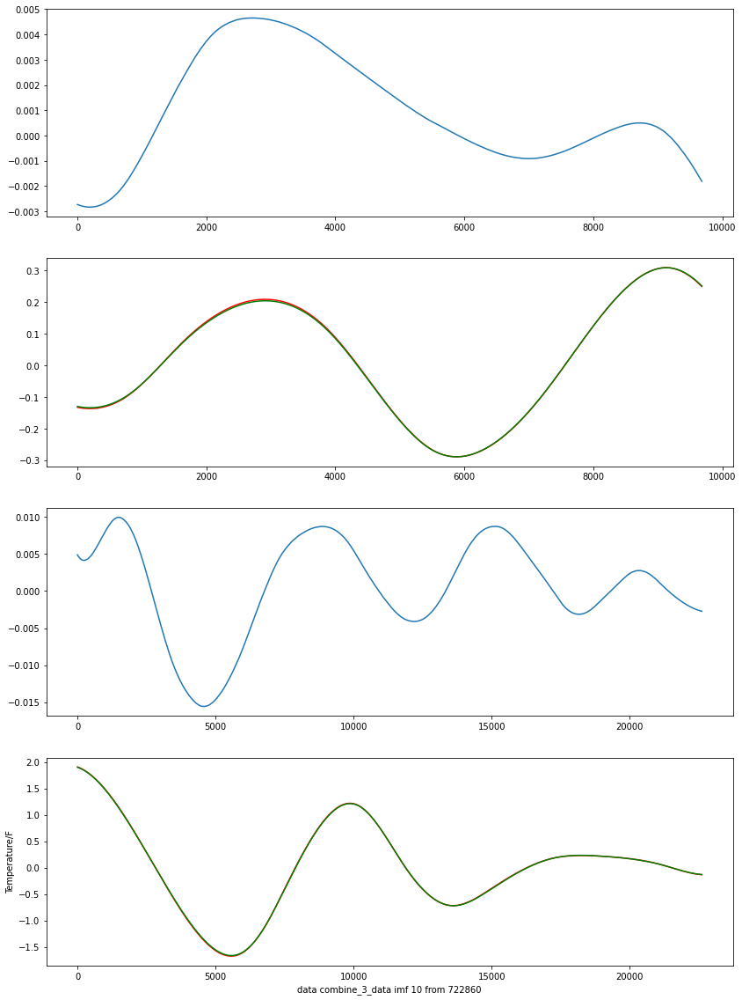

Epoch:2
MSE
TRAIN:4.291298357945552e-05	TEST:5.564824374010412e-06
Base_line:2.1258414877566902e-07	DIFFERENT:5.352240225234743e-06
TARGET:-3.036916411080986e-08
Epoch:3
MSE
TRAIN:4.291298357945552e-05	TEST:5.564824374010412e-06
Base_line:2.1258414877566902e-07	DIFFERENT:5.352240225234743e-06
TARGET:-3.54306914626115e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 746us/step - loss: 0.1135
Epoch 2/25
707/707 [==============================] - 1s 740us/step - loss: 0.1135
Epoch 3/25
707/707 [==============================] - 1s 736us/step - loss: 0.1138
Epoch 4/25
707/707 [==============================] - 1s 770us/step - loss: 0.1146
Epoch 5/25
707/707 [==============================] - 1s 792us/step - loss: 0.1134
Epoch 6/25
707/707 [==============================] - 1s 766us/step - loss: 0.1138
Epoch 7/25
707/707 [==============================] - 1s 750us/step - loss: 0.1125
Epoch 8/25
707/707 [==============================] - 1s 742us/step - loss: 0.1142
Epo

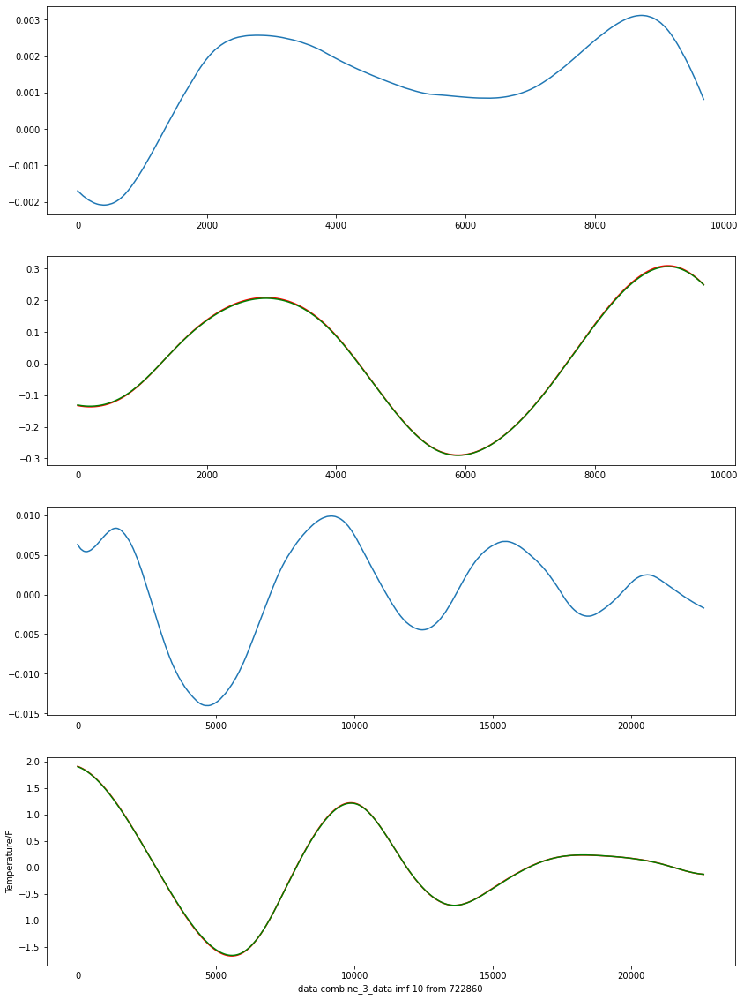

Epoch:3
MSE
TRAIN:3.83813523286181e-05	TEST:3.584297102395714e-06
Base_line:2.1258414877566902e-07	DIFFERENT:3.3717129536200448e-06
TARGET:-3.54306914626115e-08
Epoch:4
MSE
TRAIN:3.83813523286181e-05	TEST:3.584297102395714e-06
Base_line:2.1258414877566902e-07	DIFFERENT:3.3717129536200448e-06
TARGET:-4.25168297551338e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 725us/step - loss: 0.1103
Epoch 2/25
707/707 [==============================] - 1s 732us/step - loss: 0.1102
Epoch 3/25
707/707 [==============================] - 1s 736us/step - loss: 0.1090
Epoch 4/25
707/707 [==============================] - 1s 768us/step - loss: 0.1072
Epoch 5/25
707/707 [==============================] - 1s 782us/step - loss: 0.1087
Epoch 6/25
707/707 [==============================] - 1s 763us/step - loss: 0.1068
Epoch 7/25
707/707 [==============================] - 1s 719us/step - loss: 0.1085
Epoch 8/25
707/707 [==============================] - 1s 731us/step - loss: 0.1093
Epoc

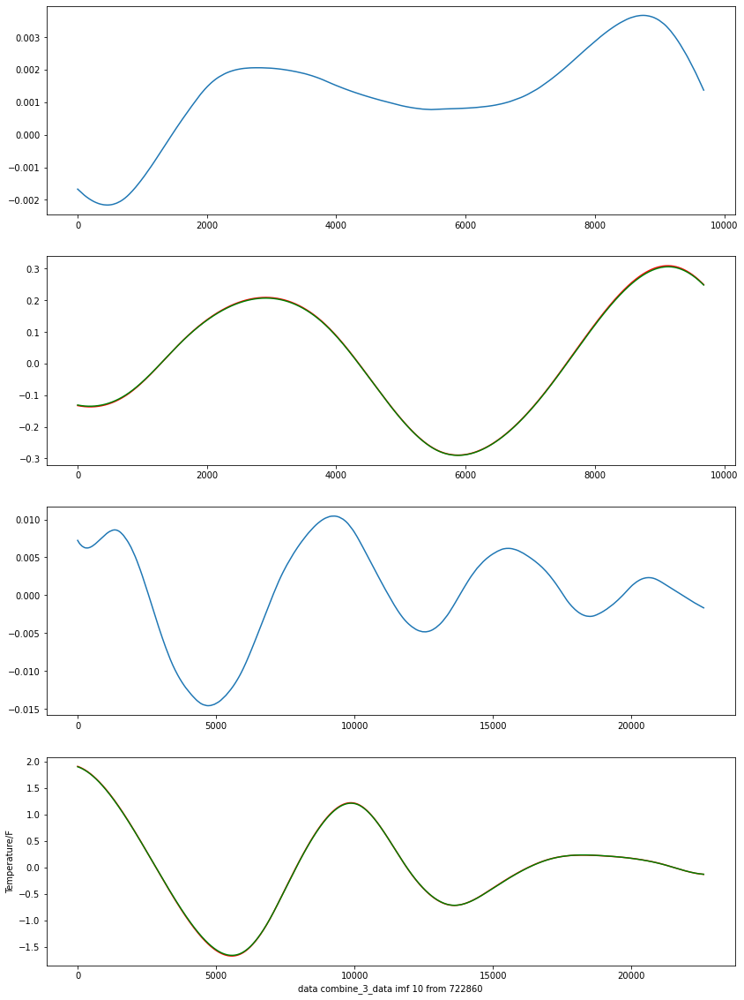

Epoch:4
MSE
TRAIN:4.153270209095198e-05	TEST:3.7033952891831194e-06
Base_line:2.1258414877566902e-07	DIFFERENT:3.4908111404074502e-06
TARGET:-4.25168297551338e-08
Epoch:5
MSE
TRAIN:4.153270209095198e-05	TEST:3.7033952891831194e-06
Base_line:2.1258414877566902e-07	DIFFERENT:3.4908111404074502e-06
TARGET:-5.3146037193917255e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 731us/step - loss: 0.1051
Epoch 2/25
707/707 [==============================] - 1s 739us/step - loss: 0.1030
Epoch 3/25
707/707 [==============================] - 1s 733us/step - loss: 0.1060
Epoch 4/25
707/707 [==============================] - 1s 736us/step - loss: 0.1030
Epoch 5/25
707/707 [==============================] - 1s 768us/step - loss: 0.1061
Epoch 6/25
707/707 [==============================] - 1s 757us/step - loss: 0.1028
Epoch 7/25
707/707 [==============================] - 1s 748us/step - loss: 0.1037
Epoch 8/25
707/707 [==============================] - 1s 744us/step - loss: 0.102

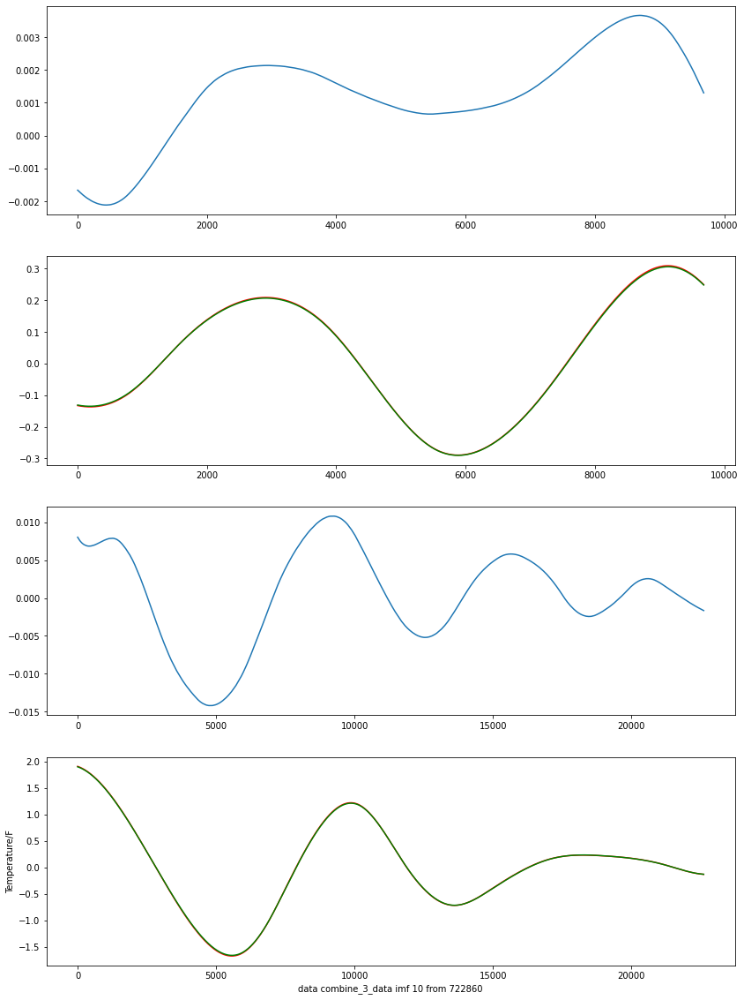

Epoch:5
MSE
TRAIN:4.060202988923852e-05	TEST:3.773843975920651e-06
Base_line:2.1258414877566902e-07	DIFFERENT:3.5612598271449817e-06
TARGET:-5.3146037193917255e-08
Epoch:6
MSE
TRAIN:4.060202988923852e-05	TEST:3.773843975920651e-06
Base_line:2.1258414877566902e-07	DIFFERENT:3.5612598271449817e-06
TARGET:-7.0861382925223e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 759us/step - loss: 0.0991
Epoch 2/25
707/707 [==============================] - 1s 748us/step - loss: 0.1002
Epoch 3/25
707/707 [==============================] - 1s 732us/step - loss: 0.0993
Epoch 4/25
707/707 [==============================] - 1s 768us/step - loss: 0.0994
Epoch 5/25
707/707 [==============================] - 1s 778us/step - loss: 0.0980
Epoch 6/25
707/707 [==============================] - 1s 772us/step - loss: 0.0983
Epoch 7/25
707/707 [==============================] - 1s 749us/step - loss: 0.0995
Epoch 8/25
707/707 [==============================] - 1s 732us/step - loss: 0.0997
E

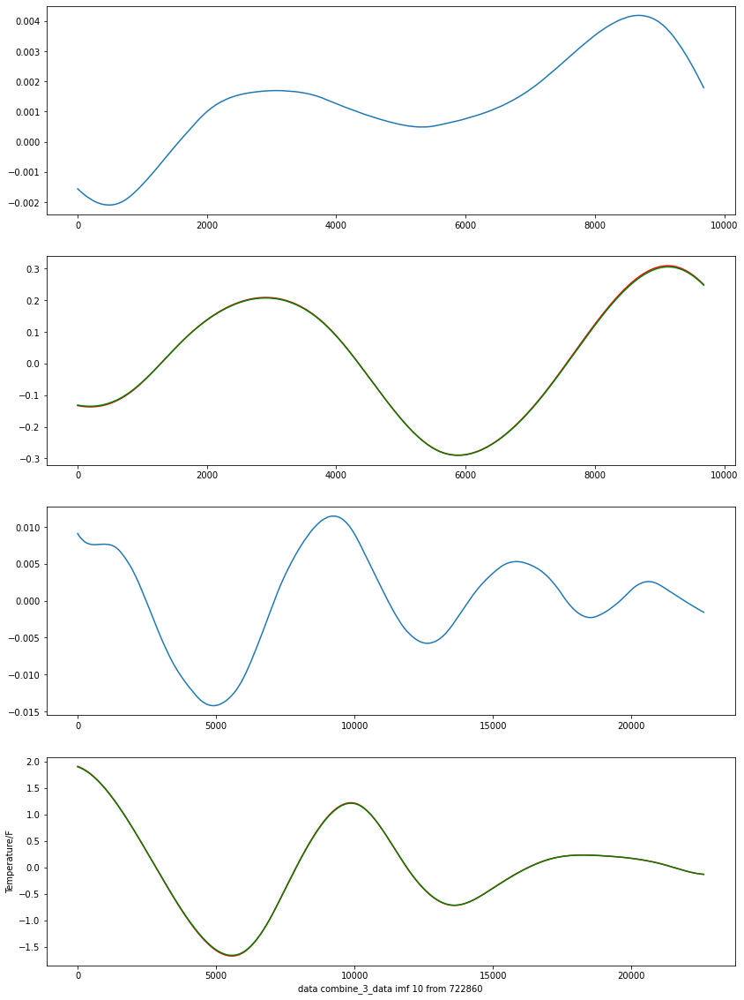

Epoch:6
MSE
TRAIN:4.2154353141467996e-05	TEST:4.258635193320428e-06
Base_line:2.1258414877566902e-07	DIFFERENT:4.046051044544759e-06
TARGET:-7.0861382925223e-08
Epoch:7
MSE
TRAIN:4.2154353141467996e-05	TEST:4.258635193320428e-06
Base_line:2.1258414877566902e-07	DIFFERENT:4.046051044544759e-06
TARGET:-1.0629207438783451e-07
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 752us/step - loss: 0.0984
Epoch 2/25
707/707 [==============================] - 1s 749us/step - loss: 0.0970
Epoch 3/25
707/707 [==============================] - 1s 736us/step - loss: 0.0953
Epoch 4/25
707/707 [==============================] - 1s 748us/step - loss: 0.0958
Epoch 5/25
707/707 [==============================] - 1s 785us/step - loss: 0.0939
Epoch 6/25
707/707 [==============================] - 1s 778us/step - loss: 0.0959
Epoch 7/25
707/707 [==============================] - 1s 748us/step - loss: 0.0952
Epoch 8/25
707/707 [==============================] - 1s 734us/step - loss: 0.0952
E

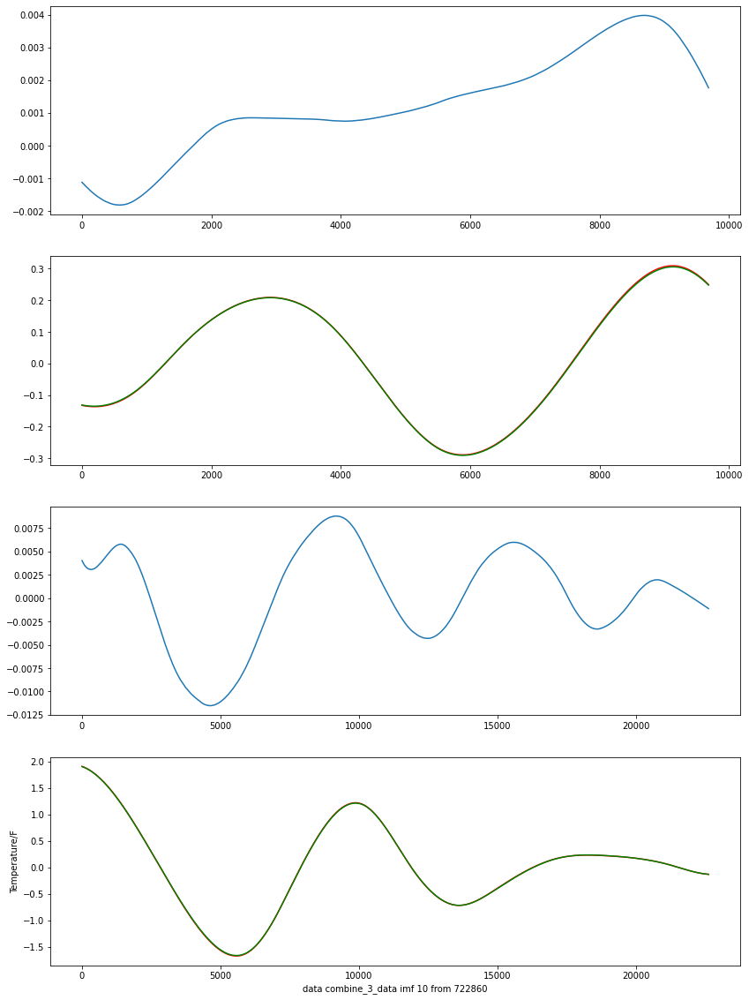

Epoch:7
MSE
TRAIN:2.7385906499076537e-05	TEST:3.999836806046403e-06
Base_line:2.1258414877566902e-07	DIFFERENT:3.787252657270734e-06
TARGET:-1.0629207438783451e-07
Epoch:8
MSE
TRAIN:2.7385906499076537e-05	TEST:3.999836806046403e-06
Base_line:2.1258414877566902e-07	DIFFERENT:3.787252657270734e-06
TARGET:-2.1258414877566902e-07
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 762us/step - loss: 0.0937
Epoch 2/25
707/707 [==============================] - 1s 752us/step - loss: 0.0944
Epoch 3/25
707/707 [==============================] - 1s 749us/step - loss: 0.0940
Epoch 4/25
707/707 [==============================] - 1s 741us/step - loss: 0.0931
Epoch 5/25
707/707 [==============================] - 1s 779us/step - loss: 0.0916
Epoch 6/25
707/707 [==============================] - 1s 775us/step - loss: 0.0913
Epoch 7/25
707/707 [==============================] - 1s 757us/step - loss: 0.0919
Epoch 8/25
707/707 [==============================] - 1s 741us/step - loss: 0.090

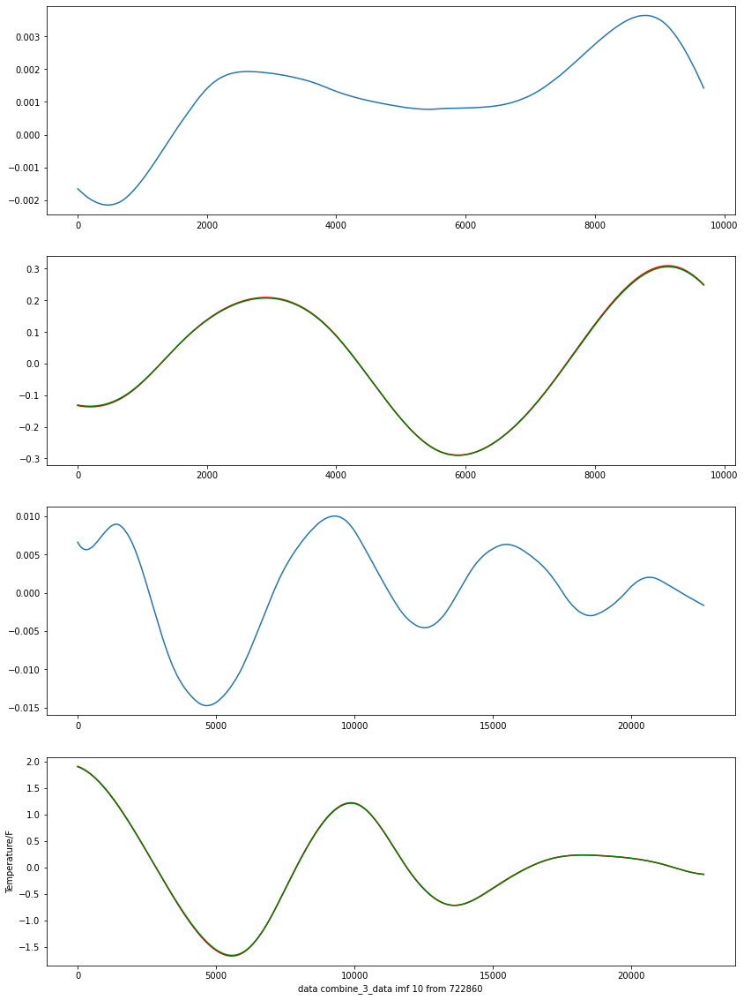

Epoch:8
MSE
TRAIN:4.126390411182055e-05	TEST:3.4703992807693335e-06
Base_line:2.1258414877566902e-07	DIFFERENT:3.2578151319936644e-06
TARGET:-2.1258414877566902e-07
Epoch:9
MSE
TRAIN:4.126390411182055e-05	TEST:3.4703992807693335e-06
Base_line:2.1258414877566902e-07	DIFFERENT:3.2578151319936644e-06
TARGET:inf
重新训练25次
Epoch 1/25
205/707 [=======>......................] - ETA: 0s - loss: 0.0931

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in double_scalars


707/707 [==============================] - 1s 748us/step - loss: 0.0917
Epoch 2/25
707/707 [==============================] - 1s 729us/step - loss: 0.0926
Epoch 3/25
707/707 [==============================] - 1s 735us/step - loss: 0.0885
Epoch 4/25
707/707 [==============================] - 1s 741us/step - loss: 0.0898
Epoch 5/25
707/707 [==============================] - 1s 794us/step - loss: 0.0889
Epoch 6/25
707/707 [==============================] - 1s 981us/step - loss: 0.0894
Epoch 7/25
707/707 [==============================] - 1s 784us/step - loss: 0.0894
Epoch 8/25
707/707 [==============================] - 1s 781us/step - loss: 0.0897
Epoch 9/25
707/707 [==============================] - 1s 804us/step - loss: 0.0891
Epoch 10/25
707/707 [==============================] - 1s 775us/step - loss: 0.0899
Epoch 11/25
707/707 [==============================] - 1s 760us/step - loss: 0.0876
Epoch 12/25
707/707 [==============================] - 1s 744us/step - loss: 0.0872
Epoch 13/25


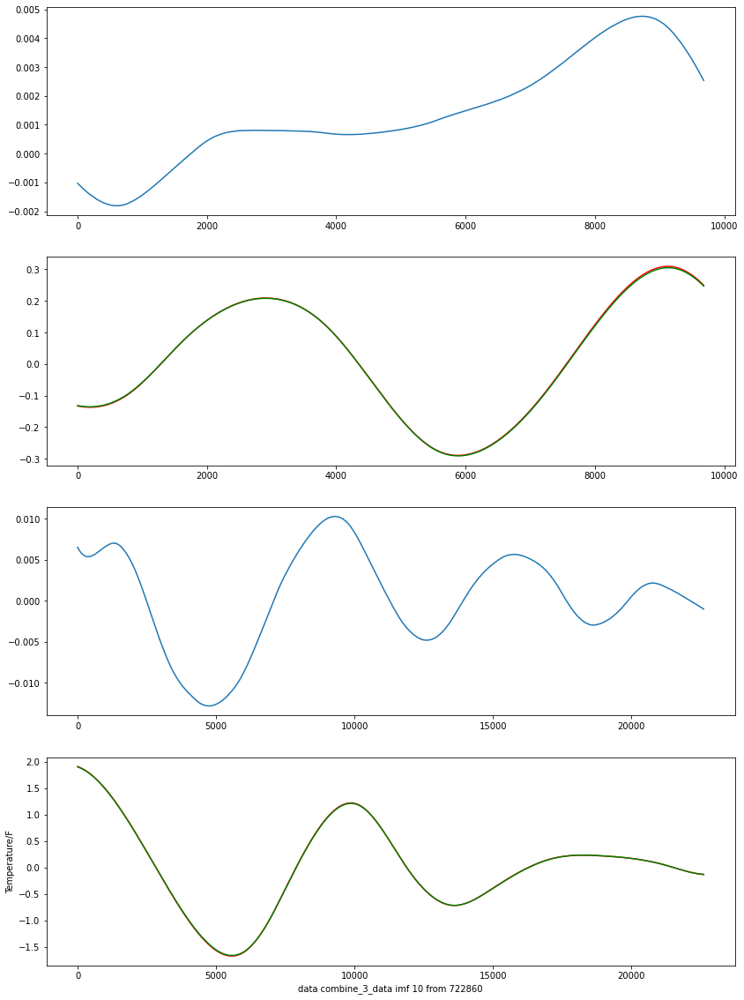

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: divide by zero encountered in double_scalars
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars


Epoch:9
MSE
TRAIN:3.480457139327925e-05	TEST:5.198084673922888e-06
Base_line:2.1258414877566902e-07	DIFFERENT:4.9855005251472195e-06
TARGET:inf
INFO:tensorflow:Assets written to: ./tf_model_3in1_params_1628050912.707525/722860_combine_3_data_imf10.params/assets
-------------------------------------------------------------------
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 21)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2816      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_______________________________________________________

707/707 [==============================] - 1s 763us/step - loss: 0.0835
Epoch 80/100
707/707 [==============================] - 1s 744us/step - loss: 0.0853
Epoch 81/100
707/707 [==============================] - 1s 732us/step - loss: 0.0862
Epoch 82/100
707/707 [==============================] - 1s 720us/step - loss: 0.0826
Epoch 83/100
707/707 [==============================] - 1s 731us/step - loss: 0.0852
Epoch 84/100
707/707 [==============================] - 1s 711us/step - loss: 0.0833
Epoch 85/100
707/707 [==============================] - 1s 709us/step - loss: 0.0838
Epoch 86/100
707/707 [==============================] - 1s 710us/step - loss: 0.0831
Epoch 87/100
707/707 [==============================] - 0s 707us/step - loss: 0.0837
Epoch 88/100
707/707 [==============================] - 1s 738us/step - loss: 0.0807
Epoch 89/100
707/707 [==============================] - 1s 761us/step - loss: 0.0850
Epoch 90/100
707/707 [==============================] - 1s 746us/step - loss: 

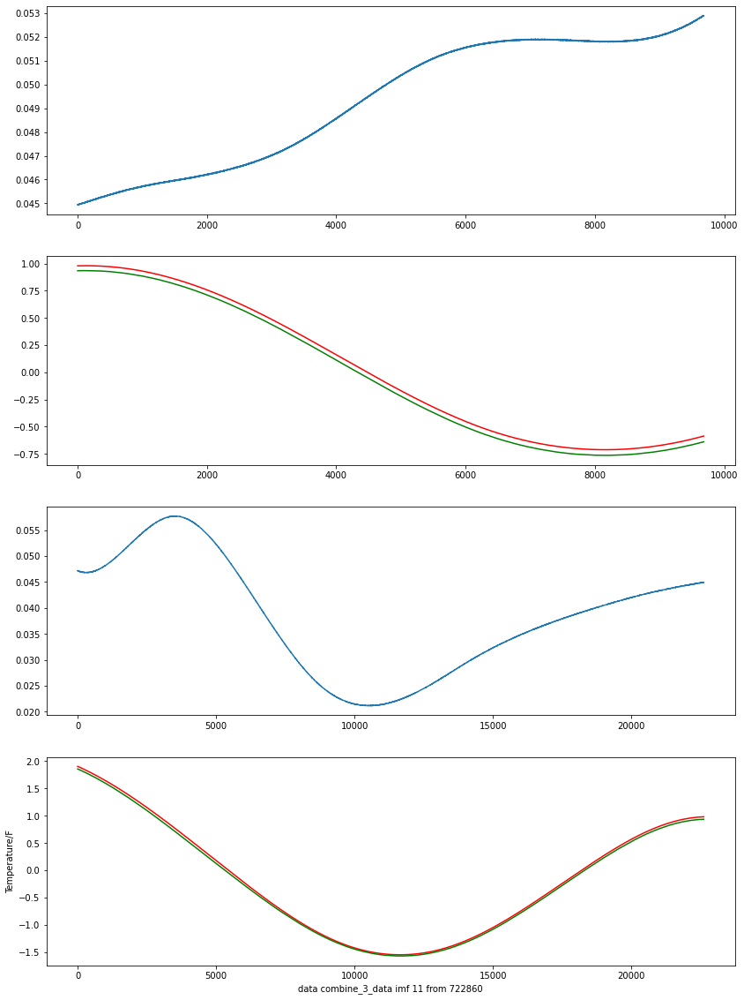

Epoch:1
MSE
TRAIN:0.0015847421908828537	TEST:0.0024383426504673094
Base_line:7.189212399132807e-08	DIFFERENT:0.002438270758343318
TARGET:-7.98801377681423e-09
Epoch:2
MSE
TRAIN:0.0015847421908828537	TEST:0.0024383426504673094
Base_line:7.189212399132807e-08	DIFFERENT:0.002438270758343318
TARGET:-8.986515498916009e-09
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 734us/step - loss: 0.0786
Epoch 2/25
707/707 [==============================] - 1s 759us/step - loss: 0.0780
Epoch 3/25
707/707 [==============================] - 1s 720us/step - loss: 0.0776
Epoch 4/25
707/707 [==============================] - 1s 712us/step - loss: 0.0781
Epoch 5/25
707/707 [==============================] - 1s 715us/step - loss: 0.0771
Epoch 6/25
707/707 [==============================] - 1s 734us/step - loss: 0.0770
Epoch 7/25
707/707 [==============================] - 1s 759us/step - loss: 0.0789
Epoch 8/25
707/707 [==============================] - 1s 763us/step - loss: 0.0788
Epoch 9

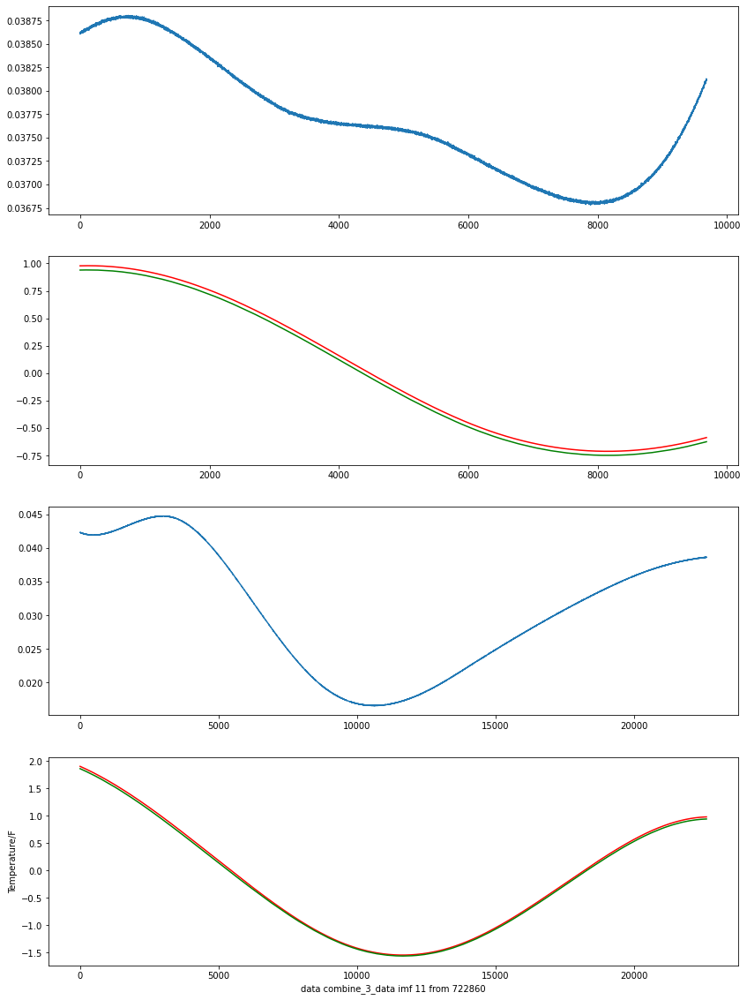

Epoch:2
MSE
TRAIN:0.001024855993905032	TEST:0.0014203101888241412
Base_line:7.189212399132807e-08	DIFFERENT:0.0014202382967001498
TARGET:-8.986515498916009e-09
Epoch:3
MSE
TRAIN:0.001024855993905032	TEST:0.0014203101888241412
Base_line:7.189212399132807e-08	DIFFERENT:0.0014202382967001498
TARGET:-1.0270303427332581e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 738us/step - loss: 0.0744
Epoch 2/25
707/707 [==============================] - 1s 721us/step - loss: 0.0741
Epoch 3/25
707/707 [==============================] - 1s 748us/step - loss: 0.0765
Epoch 4/25
707/707 [==============================] - 1s 714us/step - loss: 0.0746
Epoch 5/25
707/707 [==============================] - 1s 722us/step - loss: 0.0753
Epoch 6/25
707/707 [==============================] - 1s 708us/step - loss: 0.0751
Epoch 7/25
707/707 [==============================] - 1s 708us/step - loss: 0.0737
Epoch 8/25
707/707 [==============================] - 1s 787us/step - loss: 0.0744
Epoch

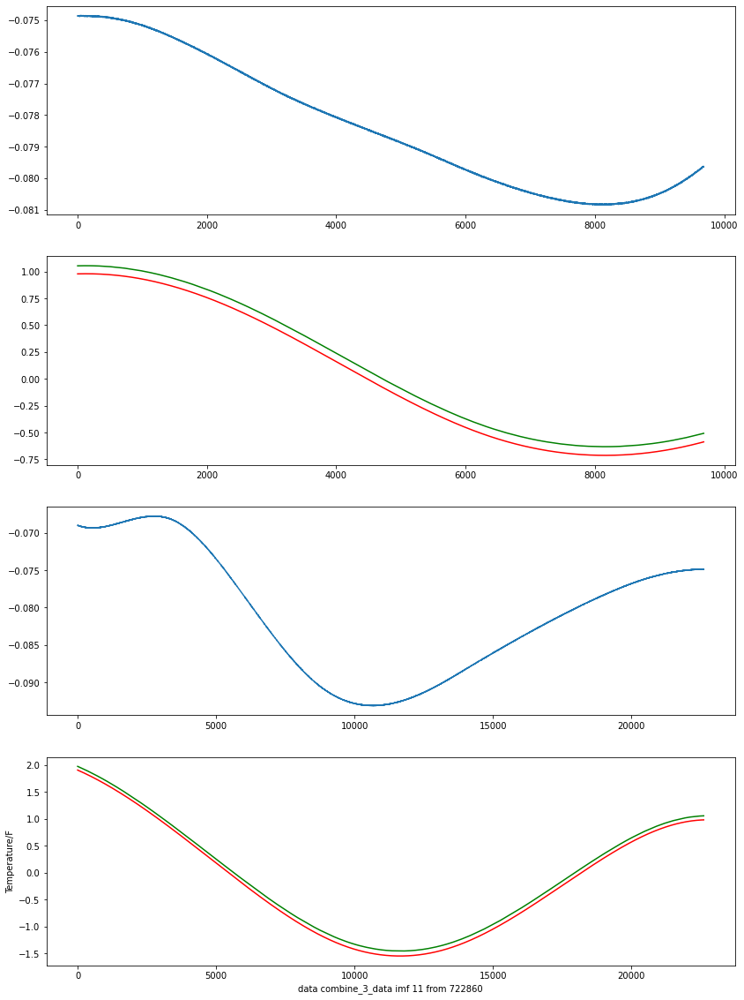

Epoch:3
MSE
TRAIN:0.006596046257384388	TEST:0.006145138459076164
Base_line:7.189212399132807e-08	DIFFERENT:0.006145066566952173
TARGET:-1.0270303427332581e-08
Epoch:4
MSE
TRAIN:0.006596046257384388	TEST:0.006145138459076164
Base_line:7.189212399132807e-08	DIFFERENT:0.006145066566952173
TARGET:-1.1982020665221344e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 754us/step - loss: 0.0755
Epoch 2/25
707/707 [==============================] - 1s 724us/step - loss: 0.0738
Epoch 3/25
707/707 [==============================] - 0s 701us/step - loss: 0.0722
Epoch 4/25
707/707 [==============================] - 1s 736us/step - loss: 0.0735
Epoch 5/25
707/707 [==============================] - 1s 710us/step - loss: 0.0714
Epoch 6/25
707/707 [==============================] - 1s 767us/step - loss: 0.0734
Epoch 7/25
707/707 [==============================] - 1s 719us/step - loss: 0.0721
Epoch 8/25
707/707 [==============================] - 1s 707us/step - loss: 0.0711
Epoch 9/

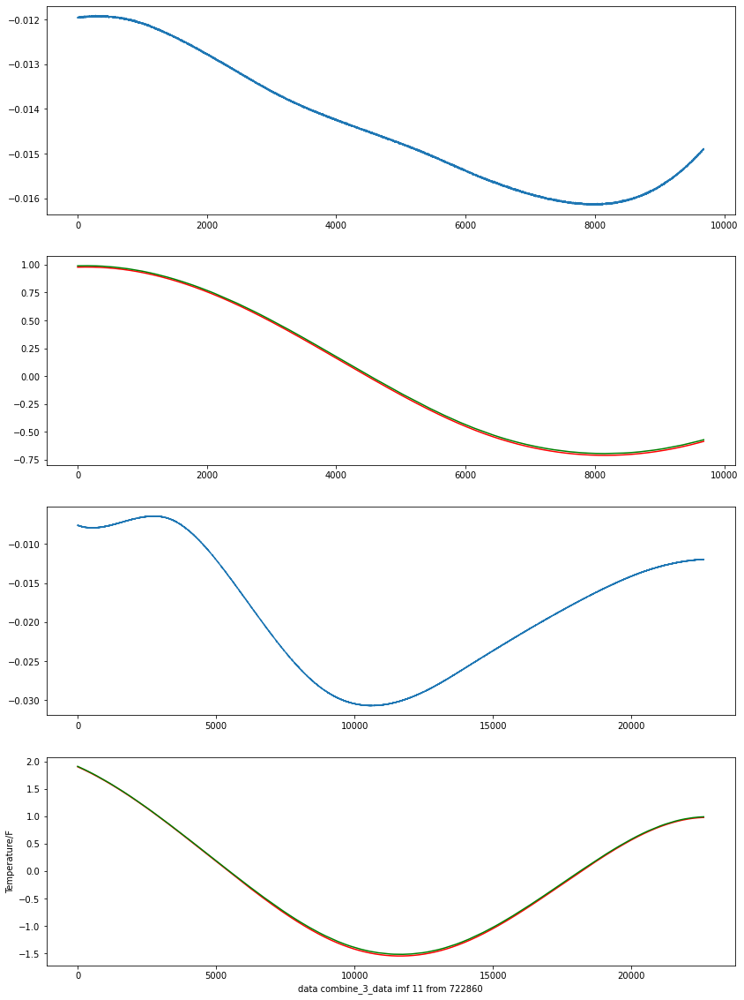

Epoch:4
MSE
TRAIN:0.000412110224540015	TEST:0.00020901647890804575
Base_line:7.189212399132807e-08	DIFFERENT:0.00020894458678405442
TARGET:-1.1982020665221344e-08
Epoch:5
MSE
TRAIN:0.000412110224540015	TEST:0.00020901647890804575
Base_line:7.189212399132807e-08	DIFFERENT:0.00020894458678405442
TARGET:-1.4378424798265614e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 778us/step - loss: 0.0701
Epoch 2/25
707/707 [==============================] - 1s 740us/step - loss: 0.0718
Epoch 3/25
707/707 [==============================] - 1s 728us/step - loss: 0.0718
Epoch 4/25
707/707 [==============================] - 1s 715us/step - loss: 0.0721
Epoch 5/25
707/707 [==============================] - 1s 733us/step - loss: 0.0707
Epoch 6/25
707/707 [==============================] - 1s 714us/step - loss: 0.0701
Epoch 7/25
707/707 [==============================] - 1s 961us/step - loss: 0.0703
Epoch 8/25
707/707 [==============================] - 1s 738us/step - loss: 0.0689


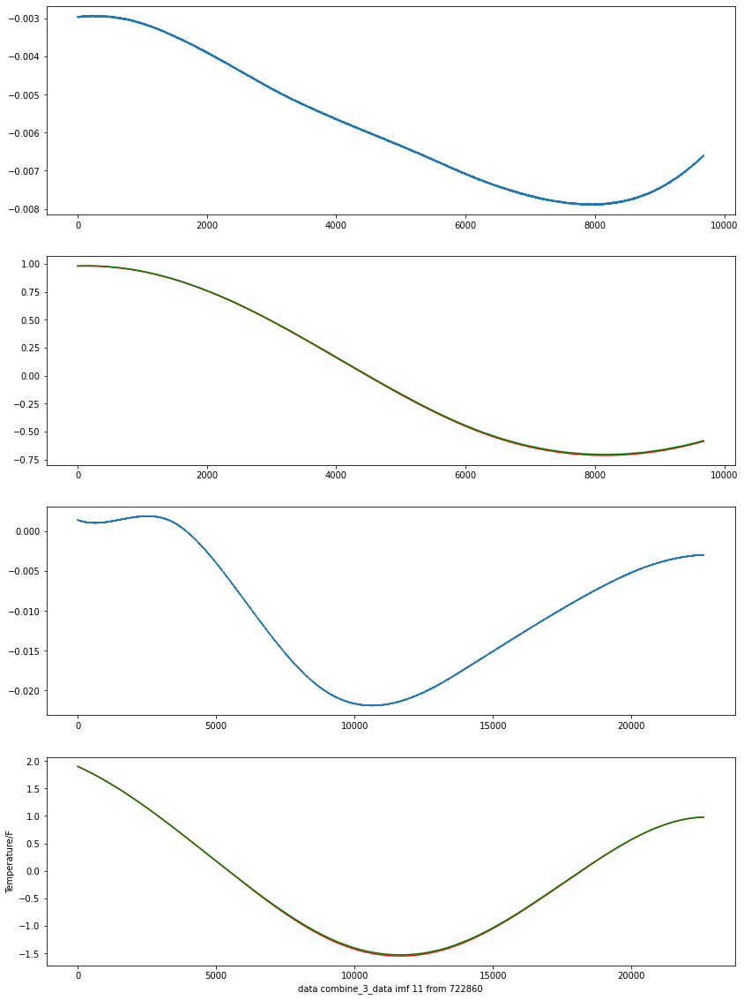

Epoch:5
MSE
TRAIN:0.0001645424623490156	TEST:3.708663627339661e-05
Base_line:7.189212399132807e-08	DIFFERENT:3.7014744149405286e-05
TARGET:-1.4378424798265614e-08
Epoch:6
MSE
TRAIN:0.0001645424623490156	TEST:3.708663627339661e-05
Base_line:7.189212399132807e-08	DIFFERENT:3.7014744149405286e-05
TARGET:-1.7973030997832017e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 780us/step - loss: 0.0705
Epoch 2/25
707/707 [==============================] - 1s 758us/step - loss: 0.0692
Epoch 3/25
707/707 [==============================] - 1s 734us/step - loss: 0.0688
Epoch 4/25
707/707 [==============================] - 1s 724us/step - loss: 0.0681
Epoch 5/25
707/707 [==============================] - 1s 736us/step - loss: 0.0686
Epoch 6/25
707/707 [==============================] - 1s 938us/step - loss: 0.0703
Epoch 7/25
707/707 [==============================] - 1s 868us/step - loss: 0.0678
Epoch 8/25
707/707 [==============================] - 1s 799us/step - loss: 0.0671


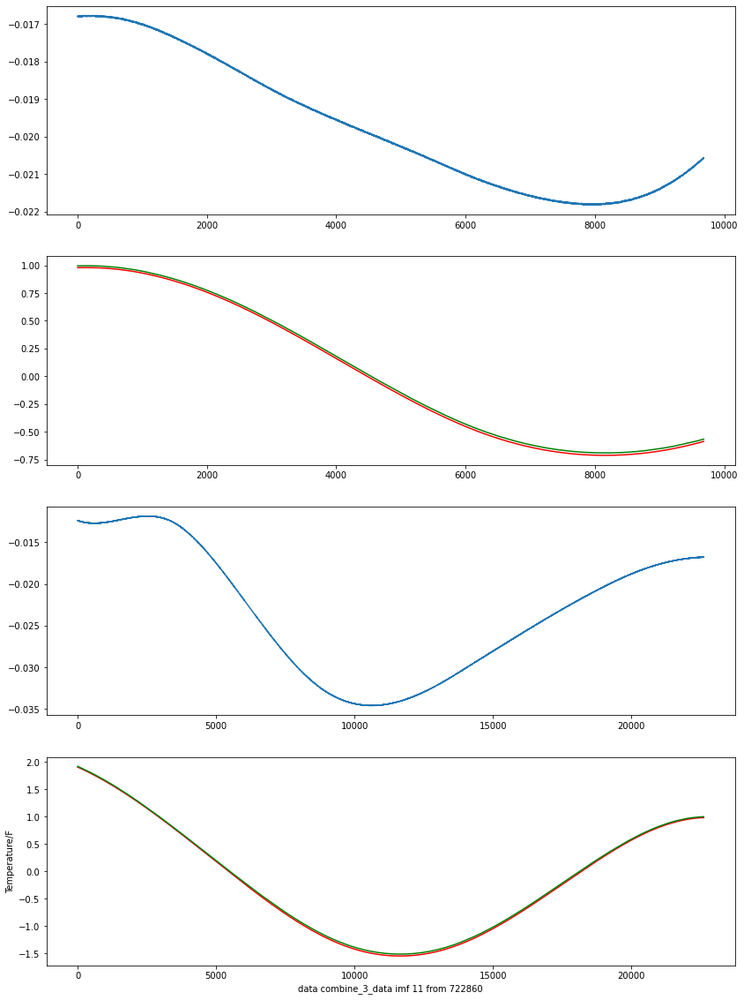

Epoch:6
MSE
TRAIN:0.0006002726009439264	TEST:0.0003931054361617243
Base_line:7.189212399132807e-08	DIFFERENT:0.000393033544037733
TARGET:-1.7973030997832017e-08
Epoch:7
MSE
TRAIN:0.0006002726009439264	TEST:0.0003931054361617243
Base_line:7.189212399132807e-08	DIFFERENT:0.000393033544037733
TARGET:-2.396404133044269e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 784us/step - loss: 0.0687
Epoch 2/25
707/707 [==============================] - 1s 757us/step - loss: 0.0666
Epoch 3/25
707/707 [==============================] - 1s 727us/step - loss: 0.0651
Epoch 4/25
707/707 [==============================] - 1s 710us/step - loss: 0.0662
Epoch 5/25
707/707 [==============================] - 1s 738us/step - loss: 0.0658
Epoch 6/25
707/707 [==============================] - 1s 724us/step - loss: 0.0675
Epoch 7/25
707/707 [==============================] - 1s 735us/step - loss: 0.0667
Epoch 8/25
707/707 [==============================] - 1s 721us/step - loss: 0.0666
Epoch

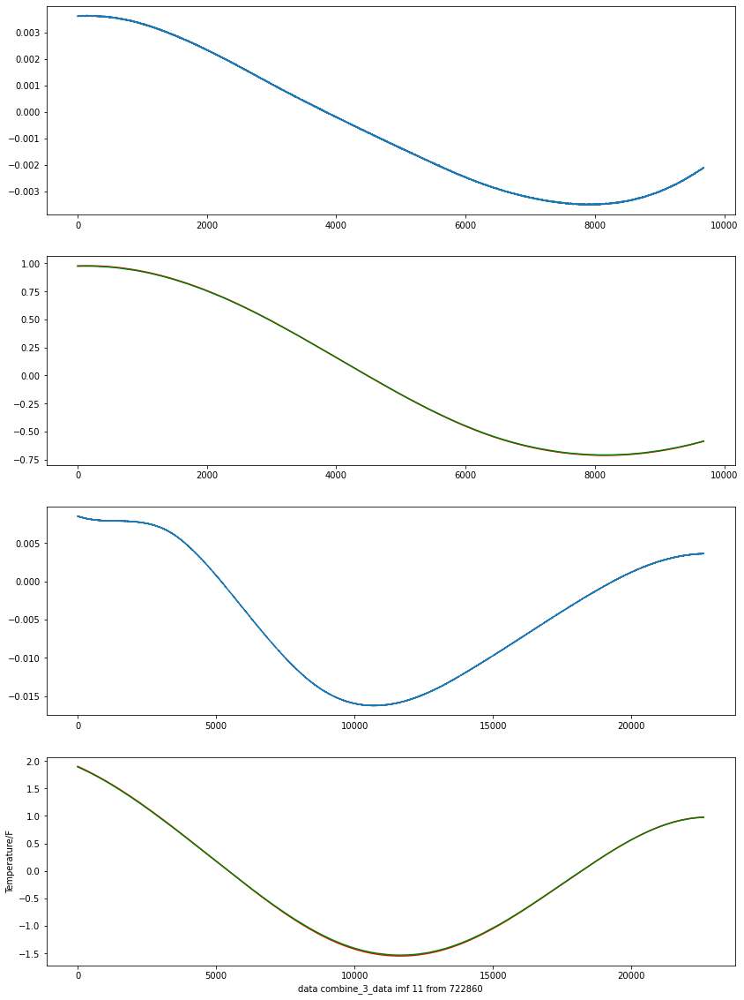

Epoch:7
MSE
TRAIN:8.665446480963658e-05	TEST:6.651742214546669e-06
Base_line:7.189212399132807e-08	DIFFERENT:6.579850090555341e-06
TARGET:-2.396404133044269e-08
Epoch:8
MSE
TRAIN:8.665446480963658e-05	TEST:6.651742214546669e-06
Base_line:7.189212399132807e-08	DIFFERENT:6.579850090555341e-06
TARGET:-3.5946061995664035e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 757us/step - loss: 0.0647
Epoch 2/25
707/707 [==============================] - 1s 771us/step - loss: 0.0656
Epoch 3/25
707/707 [==============================] - 1s 764us/step - loss: 0.0643
Epoch 4/25
707/707 [==============================] - 1s 732us/step - loss: 0.0646
Epoch 5/25
707/707 [==============================] - 1s 723us/step - loss: 0.0634
Epoch 6/25
707/707 [==============================] - 1s 741us/step - loss: 0.0652
Epoch 7/25
707/707 [==============================] - 1s 725us/step - loss: 0.0642
Epoch 8/25
707/707 [==============================] - 1s 732us/step - loss: 0.0655
Epo

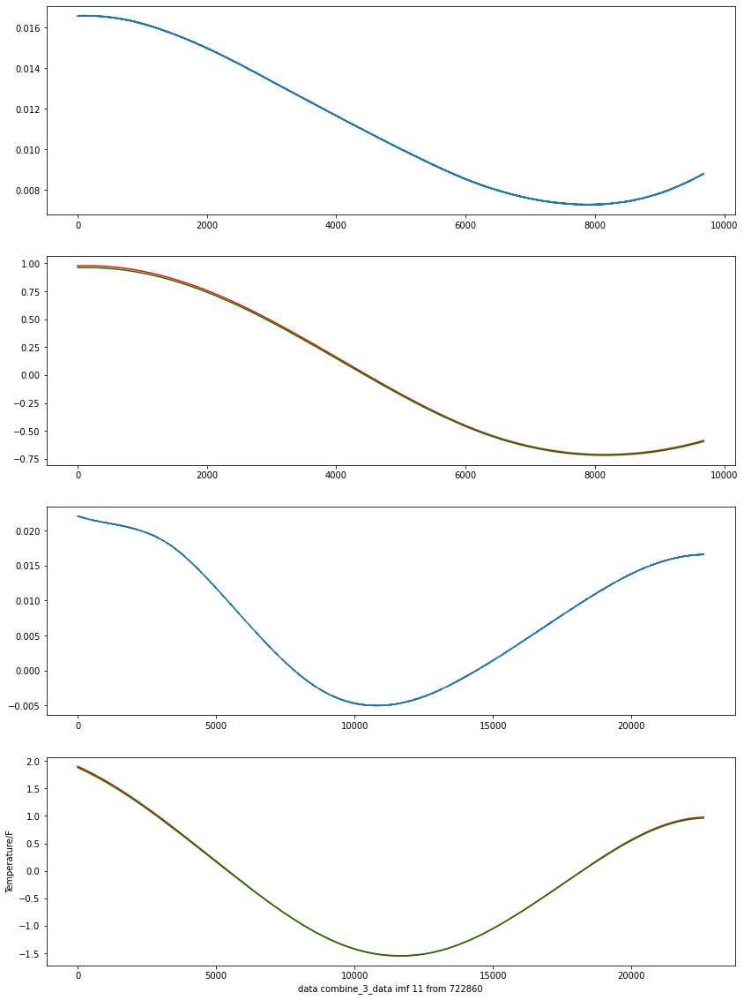

Epoch:8
MSE
TRAIN:0.0001326968320460009	TEST:0.00013419369916821064
Base_line:7.189212399132807e-08	DIFFERENT:0.0001341218070442193
TARGET:-3.5946061995664035e-08
Epoch:9
MSE
TRAIN:0.0001326968320460009	TEST:0.00013419369916821064
Base_line:7.189212399132807e-08	DIFFERENT:0.0001341218070442193
TARGET:-7.189212399132807e-08
重新训练25次
Epoch 1/25
707/707 [==============================] - 1s 736us/step - loss: 0.0629
Epoch 2/25
707/707 [==============================] - 1s 757us/step - loss: 0.0623
Epoch 3/25
707/707 [==============================] - 1s 753us/step - loss: 0.0624
Epoch 4/25
707/707 [==============================] - 1s 736us/step - loss: 0.0630
Epoch 5/25
707/707 [==============================] - 1s 719us/step - loss: 0.0630
Epoch 6/25
707/707 [==============================] - 1s 736us/step - loss: 0.0627
Epoch 7/25
707/707 [==============================] - 1s 712us/step - loss: 0.0631
Epoch 8/25
707/707 [==============================] - 1s 859us/step - loss: 0.0628
E

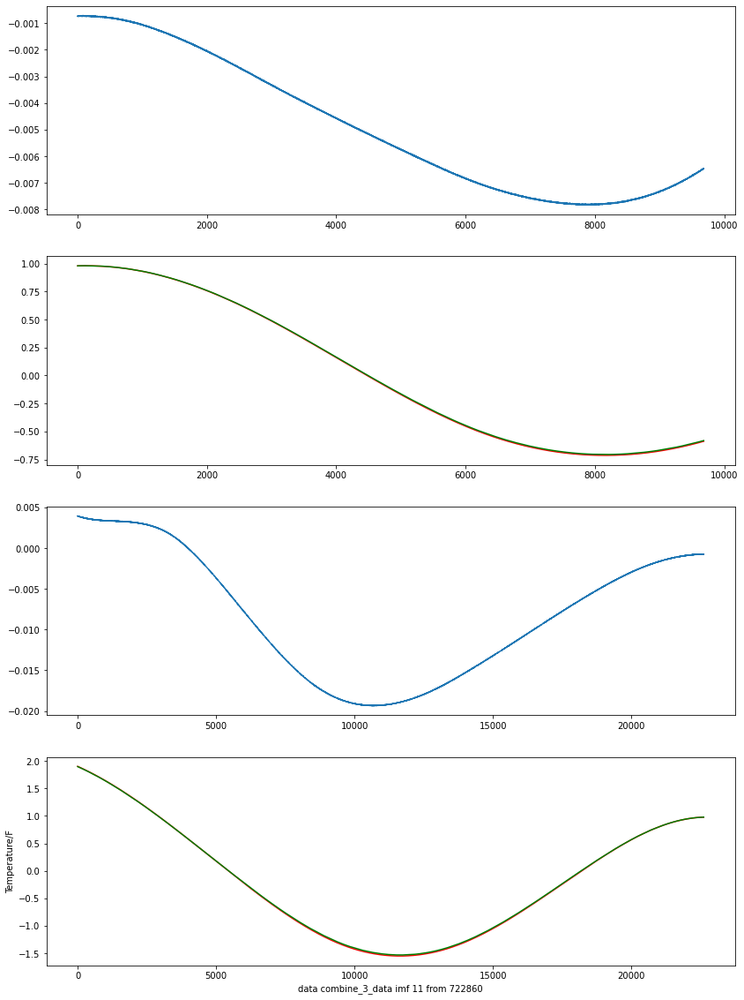

Epoch:9
MSE
TRAIN:0.000126681905343374	TEST:3.063088505768429e-05
Base_line:7.189212399132807e-08	DIFFERENT:3.0558992933692964e-05
TARGET:-7.189212399132807e-08
Epoch:10
MSE
TRAIN:0.000126681905343374	TEST:3.063088505768429e-05
Base_line:7.189212399132807e-08	DIFFERENT:3.0558992933692964e-05
TARGET:inf
重新训练25次
Epoch 1/25
202/707 [=======>......................] - ETA: 0s - loss: 0.0625

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in double_scalars


707/707 [==============================] - 1s 726us/step - loss: 0.0628
Epoch 2/25
707/707 [==============================] - 1s 766us/step - loss: 0.0614
Epoch 3/25
707/707 [==============================] - 1s 773us/step - loss: 0.0614
Epoch 4/25
707/707 [==============================] - 1s 759us/step - loss: 0.0605
Epoch 5/25
707/707 [==============================] - 1s 723us/step - loss: 0.0601
Epoch 6/25
707/707 [==============================] - 1s 720us/step - loss: 0.0606
Epoch 7/25
707/707 [==============================] - 1s 749us/step - loss: 0.0612
Epoch 8/25
707/707 [==============================] - 1s 728us/step - loss: 0.0623
Epoch 9/25
707/707 [==============================] - 1s 724us/step - loss: 0.0611
Epoch 10/25
707/707 [==============================] - 1s 722us/step - loss: 0.0629
Epoch 11/25
707/707 [==============================] - 1s 734us/step - loss: 0.0611
Epoch 12/25
707/707 [==============================] - 1s 780us/step - loss: 0.0612
Epoch 13/25


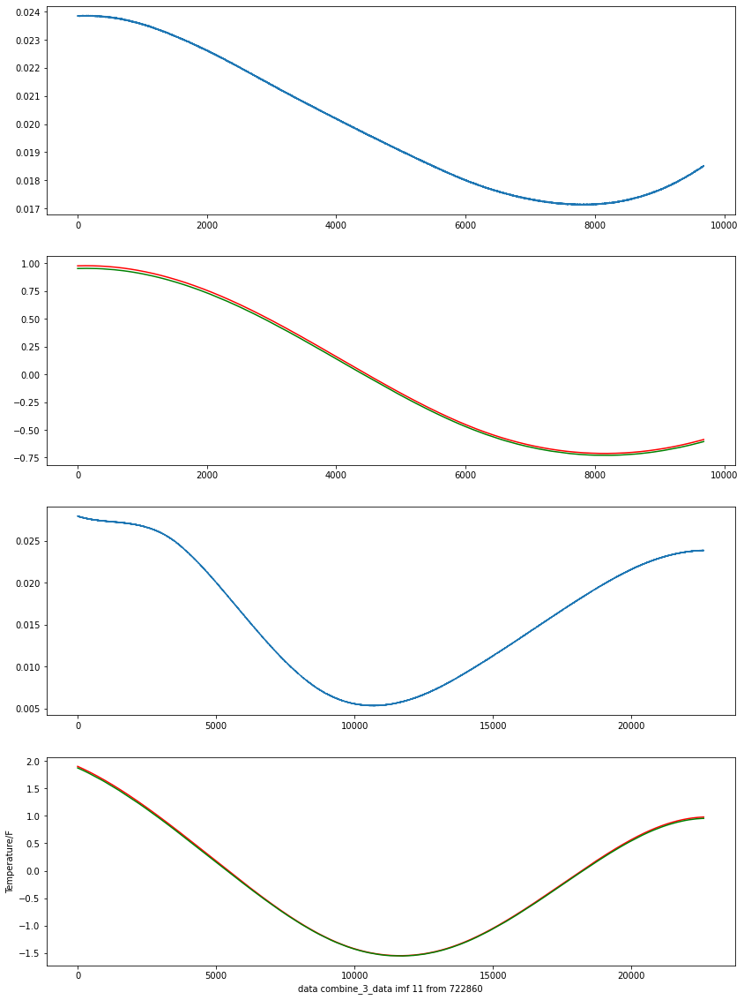

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: divide by zero encountered in double_scalars
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars


Epoch:10
MSE
TRAIN:0.00031610600615017713	TEST:0.00040005157073707344
Base_line:7.189212399132807e-08	DIFFERENT:0.00039997967861308214
TARGET:inf
INFO:tensorflow:Assets written to: ./tf_model_3in1_params_1628050912.707525/722860_combine_3_data_imf11.params/assets
-------------------------------------------------------------------


IndexError: index 12 is out of bounds for axis 0 with size 12

In [7]:
name = "combine_3_data"
error = []
train_set_avg = np.load(f"./npy/avg_%s.npy"%SITE_CODE)
train_set_min = np.load(f"./npy/min_%s.npy"%SITE_CODE)
train_set_max = np.load(f"./npy/max_%s.npy"%SITE_CODE)

print(train_set_max[3][432] == train_set_avg[3][432])

for i in range(len(train_set_avg)):
    train_sub_avg = train_set_avg[i]
    train_sub_min = train_set_min[i]
    train_sub_max = train_set_max[i]
    
    train_index = int(len(train_set_avg[0])*.7+5/9)
    
    (train_data_avg, train_label), (test_data_avg, test_label) = publicMethod.generate(train_index, train_sub_avg)
    (train_data_min, _), (test_data_min, _) = publicMethod.generate(train_index, train_sub_min)
    (train_data_max, _), (test_data_max, _) = publicMethod.generate(train_index, train_sub_max)

    train_data = np.concatenate([train_data_avg, train_data_min, train_data_max], axis = 1)
    test_data = np.concatenate([test_data_avg, test_data_min, test_data_max], axis = 1)
    
    # print(train_data_avg[0] == train_data_min[0], train_set[0])
    
    model = construct_model(train_data, train_label, test_data, test_label)
    
    mse_test = np.sum((model.predict(test_data) - test_label.reshape(-1, 1))**2)/len(test_label)
    mse_train = np.sum((model.predict(train_data) - train_label.reshape(-1, 1))**2)/len(train_label)
    
    fail_safe, index = True, 0
    base_line = np.sum((train_sub_avg[1:] - train_sub_avg[:-1])**2)/(len(train_sub_avg)-1)
    
    while mse_test >= base_line/(index-i+1) and fail_safe:
        index += 1
        print(f"\bEpoch:{index}\nMSE\nTRAIN:{mse_train}\tTEST:{mse_test}\nBase_line:{base_line}\tDIFFERENT:{abs(base_line - mse_test)}\nTARGET:{base_line/(index-i+1)}\033[0m")
        model = retrain(model, train_data, train_label)
        mse_test = np.sum((model.predict(test_data) - test_label.reshape(-1, 1))**2)/len(test_label)
        mse_train = np.sum((model.predict(train_data) - train_label.reshape(-1, 1))**2)/len(train_label)
            
        if index == 50:
            fail_safe = False
    
        plot(model.predict(test_data), test_label, model.predict(train_data), train_label, i, name)
        print(f"\bEpoch:{index}\nMSE\nTRAIN:{mse_train}\tTEST:{mse_test}\nBase_line:{base_line}\tDIFFERENT:{abs(base_line - mse_test)}\nTARGET:{base_line/(index-i+1)}")
    error.append(np.sum(abs(model.predict(train_data) - train_label.reshape(-1, 1)))/len(train_label))
        
    tf.saved_model.save(model, SAVE_PATH+f'{SITE_CODE}_{name}_imf{i}.params')
    print("-------------------------------------------------------------------")
    tf.keras.backend.clear_session()
    
plt.bar(range(len(error)), error)
plt.xlabel("index of imf")
plt.ylabel("Error (MAE)")
plt.title("Error Comparision")
plt.savefig(f"./fig/MAE_Error_Compare_{name}_%s.jpg"%SITE_CODE)
plt.show()

In [11]:
train_data = np.concatenate([train_set_avg, train_set_min, train_set_max], axis = 1)
model.predict(train_data)

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 0, the array at index 0 has size 13 and the array at index 2 has size 12

In [ ]:
train_sub_maz.shape

In [10]:
train_data.shape

(22616, 21)

In [15]:
train_set_max.shape

(12, 32308)